In [38]:
import warnings
from sklearn.datasets import fetch_openml
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
import pandas as pd
import re
import numpy as np
from sklearn.preprocessing import StandardScaler

warnings.simplefilter("ignore")

In [39]:
train = pd.read_csv("train.csv")

In [40]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [41]:
train

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S
...,...,...,...,...,...,...,...,...,...,...,...,...
886,887,0,2,"Montvila, Rev. Juozas",male,27.0,0,0,211536,13.0000,NaN,S
887,888,1,1,"Graham, Miss. Margaret Edith",female,19.0,0,0,112053,30.0000,B42,S
888,889,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",female,NaN,1,2,W./C. 6607,23.4500,NaN,S
889,890,1,1,"Behr, Mr. Karl Howell",male,26.0,0,0,111369,30.0000,C148,C


In [42]:
#suppression des colonnes non utiles
train = train.drop(['PassengerId'], axis=1)
train = train.drop(['Cabin'], axis=1)
train = train.drop(['Ticket'], axis=1)

In [43]:
#Remplacer les valeurs de la Q,S,C par 1, 2 et 3

Q = 0
S = 0
C = 0
N = 0

for i in range(len(train)):
    if train.iloc[i,8] == "Q":
        Q+=1
    elif train.iloc[i,8] == "S":
        S+=1
    elif train.iloc[i,8] == "C":
        C+=1
    else:
        N+=1
print("Q :", Q, " S :",S," C :",C," N :",N)



train['Embarked'] = train['Embarked'].replace(['Q'],'1')
train['Embarked'] = train['Embarked'].replace(['S'],'2')
train['Embarked'] = train['Embarked'].replace(['C'],'3')
train['Embarked'] = train['Embarked'].fillna('2')

Q : 77  S : 644  C : 168  N : 2


In [44]:
#Remplcaer les données catégoriques "male et female" par 1 et 0
train['Sex'] = train['Sex'].replace(['male'],'1')
train['Sex'] = train['Sex'].replace(['female'],'0')

In [45]:
train

,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Fare,Embarked
0,0,3,"Braund, Mr. Owen Harris",1,22.0,1,0,7.2500,2
1,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",0,38.0,1,0,71.2833,3
2,1,3,"Heikkinen, Miss. Laina",0,26.0,0,0,7.9250,2
3,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",0,35.0,1,0,53.1000,2
4,0,3,"Allen, Mr. William Henry",1,35.0,0,0,8.0500,2
...,...,...,...,...,...,...,...,...,...
886,0,2,"Montvila, Rev. Juozas",1,27.0,0,0,13.0000,2
887,1,1,"Graham, Miss. Margaret Edith",0,19.0,0,0,30.0000,2
888,0,3,"Johnston, Miss. Catherine Helen ""Carrie""",0,NaN,1,2,23.4500,2
889,1,1,"Behr, Mr. Karl Howell",1,26.0,0,0,30.0000,3


In [46]:
#conversion colonne Name

newV = train['Name'].copy()
liste = []

for i in range(len(newV)):
    valeur = newV[i]
    chaine = re.findall(" ([A-Za-z]+)\.", valeur)[0]
    
    if chaine not in liste:
        liste.append(chaine)
    
    if chaine == "Mr":
        newV[i] = 1
    elif chaine == "Miss":
        newV[i] = 2
    elif chaine == "Mrs":
        newV[i] = 3
    elif chaine == "Master":
        newV[i] = 4
    elif chaine == "Dr":
        newV[i] = 5
    elif chaine == "Rev":
        newV[i] = 6
    elif chaine == "Don":
        newV[i] = 7
    elif chaine == "Mme":
        newV[i] = 8
    elif chaine == "Ms":
        newV[i] = 9
    elif chaine == "Major":
        newV[i] = 10
    elif chaine == "Lady":
        newV[i] = 11
    elif chaine == "Sir":
        newV[i] = 12
    elif chaine == "Mlle":
        newV[i] = 13
    elif chaine == "Col":
        newV[i] = 14
    elif chaine == "Capt":
        newV[i] = 15
    elif chaine == "Countess":
        newV[i] = 16
    elif chaine == "Jonkheer":
        newV[i] = 17
    else:
        newV[i] = 18
        

train['Name'] = newV 
print(liste)

['Mr', 'Mrs', 'Miss', 'Master', 'Don', 'Rev', 'Dr', 'Mme', 'Ms', 'Major', 'Lady', 'Sir', 'Mlle', 'Col', 'Capt', 'Countess', 'Jonkheer']


In [47]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Name      891 non-null    object 
 3   Sex       891 non-null    object 
 4   Age       714 non-null    float64
 5   SibSp     891 non-null    int64  
 6   Parch     891 non-null    int64  
 7   Fare      891 non-null    float64
 8   Embarked  891 non-null    object 
dtypes: float64(2), int64(4), object(3)
memory usage: 62.8+ KB


In [48]:
averageAge = round(train['Age'].sum()/len(train))
train['Age'] = train['Age'].fillna(averageAge)

In [49]:
train['Embarked'] = train['Embarked'].astype('int64')
train['Name'] = train['Name'].astype('int64')
train['Sex'] = train['Sex'].astype('int64')

In [50]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Survived  891 non-null    int64  
 1   Pclass    891 non-null    int64  
 2   Name      891 non-null    int64  
 3   Sex       891 non-null    int64  
 4   Age       891 non-null    float64
 5   SibSp     891 non-null    int64  
 6   Parch     891 non-null    int64  
 7   Fare      891 non-null    float64
 8   Embarked  891 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 62.8 KB


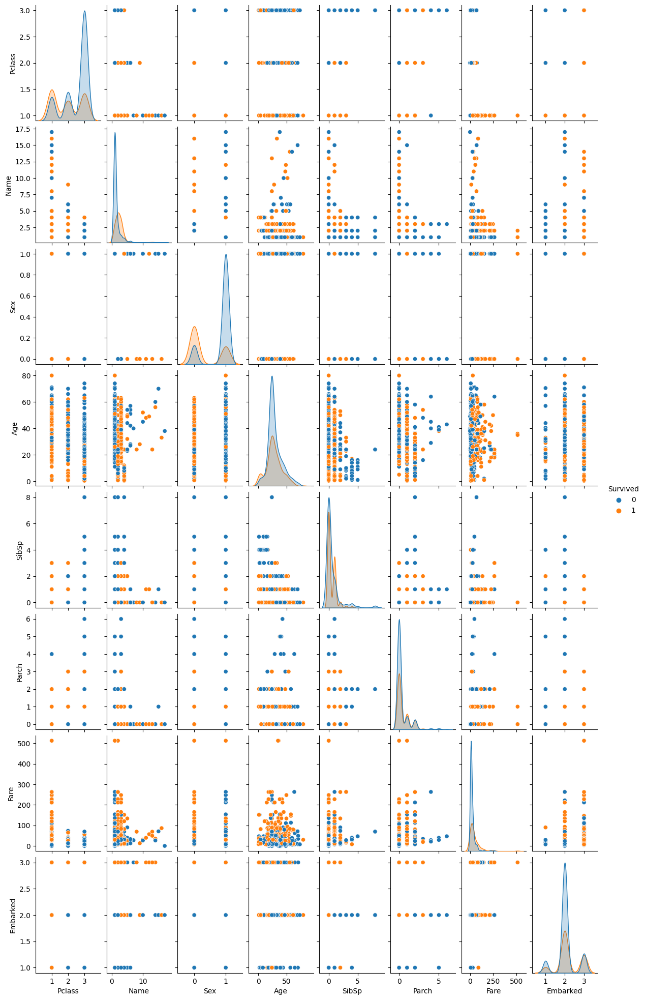

In [51]:
import seaborn as sns
donnees = pd.DataFrame(train)
sns.pairplot(donnees, aspect=0.6, hue="Survived")

In [14]:
AvecValeursManquantes = len(train)
train = train.dropna()
SansValeursManquantes = len(train)

print("Avec Valeurs Manquantes :", AvecValeursManquantes,"  Sans Valeurs Manquantes :",SansValeursManquantes)

y = train['Survived']
train = train.drop(['Survived'], axis=1)
print(y)

Avec Valeurs Manquantes : 891   Sans Valeurs Manquantes : 891
0      0
1      1
2      1
3      1
4      0
      ..
886    0
887    1
888    0
889    1
890    0
Name: Survived, Length: 891, dtype: int64


In [16]:
import time
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2, random_state=0)

print("taille test :", len(X_test))
print("taille train :", len(X_train))

start_time = time.time()
mlp = MLPClassifier()
mlp.fit(X_train, y_train)
prediction = mlp.predict(X_test)
print(accuracy_score(y_test, prediction))
print("--- %s seconds ---" % (time.time() - start_time))

taille test : 179
taille train : 712
0.8100558659217877
--- 1.2537670135498047 seconds ---


In [17]:
scaler = StandardScaler()
train = scaler.fit_transform(train)

X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2, random_state=0)


start_time = time.time()
mlp = MLPClassifier()
mlp.fit(X_train, y_train)
prediction = mlp.predict(X_test)
print(accuracy_score(y_test, prediction))
print("--- %s seconds ---" % (time.time() - start_time))

0.8212290502793296
--- 1.0851588249206543 seconds ---


In [185]:
parametres = {'hidden_layer_sizes':[(100,),(50,),(500,),(100,100),(50,50),(100,100,100),(50,50,50)],
             'activation':["identity","logistic","tanh","relu"],
             'solver':["lbfgs","sgd","adam"],
             'max_iter':[50,100,200,250],   
             'alpha':[0.0000001,0.000001,0.00001,0.0001,0.001,0.01,0.1,1],
             'learning_rate':["constant","invscaling","adaptive"]}

mlp_clf = MLPClassifier()
gridS_mlp = GridSearchCV(mlp_clf, parametres, cv=2, n_jobs=-1)
gridS_mlp.fit(X_train, y_train)

print(gridS_mlp.best_params_)

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

{'activation': 'relu', 'alpha': 1e-07, 'hidden_layer_sizes': (50, 50, 50), 'learning_rate': 'invscaling', 'max_iter': 100, 'solver': 'adam'}


In [194]:
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2, random_state=0)

maximum = 0
for i in range(200):
    
    start_time = time.time()
    mlp = MLPClassifier(activation = "relu", alpha = 1e-07, hidden_layer_sizes = (50, 50, 50), learning_rate = "invscaling",max_iter= 100, solver ="adam")
    mlp.fit(X_train, y_train)
    prediction = mlp.predict(X_test)
    
    if maximum < accuracy_score(y_test, prediction):
        maximum = accuracy_score(y_test, prediction)
        print(accuracy_score(y_test, prediction))
        print("--- %s seconds ---" % (time.time() - start_time))
        
print("Accuracy_score MAX : ", maximum)

0.8212290502793296
--- 0.4830350875854492 seconds ---
0.8268156424581006
--- 0.763953685760498 seconds ---
0.8324022346368715
--- 0.4246029853820801 seconds ---
0.8379888268156425
--- 0.42144775390625 seconds ---
0.8491620111731844
--- 0.45850467681884766 seconds ---
Accuracy_score MAX :  0.8491620111731844


In [28]:
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2, random_state=0)

maximum = 0
for i in range(500):
    
    start_time = time.time()
    mlp = MLPClassifier(activation = "relu", alpha = 1e-07, hidden_layer_sizes = (50, 50, 50), learning_rate = "invscaling",max_iter= 100, solver ="adam")
    mlp.fit(X_train, y_train)
    prediction = mlp.predict(X_test)
    
    if maximum < accuracy_score(y_test, prediction):
        maximum = accuracy_score(y_test, prediction)
        print(accuracy_score(y_test, prediction))
        print("--- %s seconds ---" % (time.time() - start_time))
        print(i)
        
print("Accuracy_score MAX : ", maximum)

0.8156424581005587
--- 0.4907393455505371 seconds ---
0
0.8268156424581006
--- 0.4163050651550293 seconds ---
2
0.8324022346368715
--- 0.40579795837402344 seconds ---
4
0.8435754189944135
--- 0.47922229766845703 seconds ---
70
Accuracy_score MAX :  0.8435754189944135


In [19]:
parametres = {'hidden_layer_sizes':[(70,),(70,70),(70,70,70)],
             'activation':["identity","logistic","tanh","relu"],
             'solver':["lbfgs","sgd","adam"],
              'max_iter':[200,300,400],
              'batch_size':[200,300,400],
             'alpha':[0.0000001,0.000001,0.00001,0.0001,0.001,0.01,0.1,1],
              'max_iter':[50,100,200,250],  
             'learning_rate':["constant","invscaling","adaptive"]}

mlp_clf = MLPClassifier()
gridS_mlp = GridSearchCV(mlp_clf, parametres, cv=2, n_jobs=-1, verbose = 11)
gridS_mlp.fit(X_train, y_train)

print(gridS_mlp.best_params_)

Fitting 2 folds for each of 10368 candidates, totalling 20736 fits


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 1/2; 1/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 1/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 9/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 9/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 9/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.831 total time=   0.1s
[CV 1/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 2/2; 5/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 5/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.823 total time=   0.2s
[CV 1/2; 32/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 32/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.792 total time=   0.3s
[CV 1/2; 49/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 49/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 2/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 2/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.784 total time=   0.1s
[CV 1/2; 16/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 16/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 17/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 17/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.239 total time=   0.2s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 8/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 8/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.837 total time=   0.4s
[CV 2/2; 56/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 56/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.733 total time=   0.3s
[CV 1/2; 67/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 67/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.795 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't c

[CV 2/2; 2/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 2/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.809 total time=   0.1s
[CV 2/2; 15/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 15/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.831 total time=   0.1s
[CV 1/2; 19/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 19/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 3/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 3/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 15/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 15/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 21/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 21/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.831 total time=   0.2s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warning

[CV 1/2; 8/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.795 total time=   0.3s
[CV 1/2; 46/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 46/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 48/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 48/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.792 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 6/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 6/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 35/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 35/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.829 total time=   0.4s
[CV 1/2; 53/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 53/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.607 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 169/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 169/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 171/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 171/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 181/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 181/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 2/2; 86/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 86/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.303 total time=   0.1s
[CV 2/2; 90/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 90/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 95/10368] START activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 95/10368] END activation=identity, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=25

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 176/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 176/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.6s
[CV 2/2; 192/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 192/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.820 total time=   0.2s
[CV 2/2; 198/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 198/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 2/2; 187/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 2/2; 189/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 189/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.820 total time=   0.1s
[CV 1/2; 193/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 193/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 1/2; 195/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70)

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 1/2; 194/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 194/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.635 total time=   0.2s
[CV 1/2; 199/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 199/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 1/2; 201/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 201/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 2/2; 144/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 144/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.820 total time=   0.3s
[CV 1/2; 156/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 156/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.798 total time=   0.1s
[CV 1/2; 163/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 163/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 266/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.559 total time=   0.1s
[CV 1/2; 271/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 271/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 274/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 274/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 277/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 197/10368] START activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 197/10368] END activation=identity, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.699 total time=   0.8s
[CV 2/2; 217/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 217/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 2/2; 218/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 218/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.770 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 253/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 253/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 2/2; 256/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 256/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 259/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 259/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 230/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.652 total time=   0.0s
[CV 2/2; 233/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 233/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.438 total time=   0.0s
[CV 2/2; 236/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 236/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.663 total time=   0.0s
[CV 1/2; 239/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 2/2; 245/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 245/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.806 total time=   0.1s
[CV 1/2; 254/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 254/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.764 total time=   0.2s
[CV 2/2; 263/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 263/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.829 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 349/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 349/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 349/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 349/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 350/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 350/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.778 total time=   0.1s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 269/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.309 total time=   0.2s
[CV 2/2; 281/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 281/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.812 total time=   0.3s
[CV 1/2; 296/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 296/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.792 total time=   0.8s
[CV 2/2; 318/10368] START activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adap

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 2/2; 321/10368] END activation=identity, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.834 total time=   0.4s
[CV 2/2; 336/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 336/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   0.1s
[CV 2/2; 342/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 342/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.834 total time=   0.1s
[CV 1/2; 353/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 1/2; 372/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 372/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.792 total time=   0.2s
[CV 2/2; 379/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 379/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 383/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 383/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 439/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 441/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 441/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.798 total time=   0.1s
[CV 1/2; 448/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 448/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 448/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 405/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 405/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.798 total time=   0.3s
[CV 1/2; 410/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 410/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.433 total time=   0.2s
[CV 2/2; 417/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 417/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 2/2; 442/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 443/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 443/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   0.1s
[CV 2/2; 450/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 450/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.834 total time=   0.1s
[CV 1/2; 459/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 415/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 415/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 2/2; 420/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 420/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.823 total time=   0.2s
[CV 1/2; 426/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 426/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 416/10368] START activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 416/10368] END activation=identity, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.531 total time=   0.9s
[CV 2/2; 445/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 445/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 447/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 447/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warning

[CV 2/2; 483/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 483/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.823 total time=   0.1s
[CV 1/2; 488/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 488/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.671 total time=   0.5s
[CV 1/2; 511/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 511/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 1/2; 510/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 510/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.792 total time=   0.2s
[CV 1/2; 516/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 516/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.795 total time=   0.3s
[CV 1/2; 521/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 521/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 462/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 472/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 472/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 476/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 476/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.795 total time=   0.5s
[CV 2/2; 496/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 585/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 604/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 604/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 604/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 604/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 610/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 470/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.815 total time=   0.1s
[CV 1/2; 478/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 478/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 1/2; 480/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 480/10368] END activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.789 total time=   0.1s
[CV 1/2; 485/10368] START activation=identity, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 1/2; 613/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 613/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 613/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 613/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 621/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 621/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 1/2; 578/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 578/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.761 total time=   0.2s
[CV 1/2; 589/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 589/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 589/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 589/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 588/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.787 total time=   0.2s
[CV 2/2; 588/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 588/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 605/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 605/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.784 total time=   0.3s
[CV 2/2; 605/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 1/2; 648/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 648/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 648/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.834 total time=   0.2s
[CV 1/2; 674/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 674/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.772 total time=   0.0s
[CV 2/2; 674/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 665/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.697 total time=   0.0s
[CV 2/2; 665/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 665/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.652 total time=   0.1s
[CV 1/2; 670/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 670/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 670/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 677/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.781 total time=   0.2s
[CV 2/2; 677/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 677/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.823 total time=   0.2s
[CV 1/2; 693/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 693/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.792 total time=   0.2s
[CV 2/2; 693/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudian

[CV 2/2; 624/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 624/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 628/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 628/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 628/10368] START activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 628/10368] END activation=identity, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 769/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 771/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 771/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.801 total time=   0.1s
[CV 2/2; 771/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 771/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.834 total time=   0.1s
[CV 1/2; 781/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 2/2; 739/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 739/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 747/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 747/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 747/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 747/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 825/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 825/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.789 total time=   0.1s
[CV 2/2; 825/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 825/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   0.1s
[CV 1/2; 835/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 835/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 2/2; 814/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 821/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 821/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.789 total time=   0.3s
[CV 2/2; 821/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 821/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.829 total time=   0.3s
[CV 1/2; 844/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 729/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 729/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 746/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 746/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.784 total time=   0.2s
[CV 2/2; 746/10368] START activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 746/10368] END activation=identity, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 829/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 829/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 829/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 838/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 838/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 2/2; 838/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), l

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 780/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 780/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 780/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 799/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 799/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 799/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 862/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 862/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 862/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 862/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 872/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 872/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 2/2; 831/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 831/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.817 total time=   0.2s
[CV 1/2; 842/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 842/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.449 total time=   0.2s
[CV 2/2; 842/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 842/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 879/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 879/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.787 total time=   0.1s
[CV 2/2; 879/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 879/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.812 total time=   0.1s
[CV 1/2; 888/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 888/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.798 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 925/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 925/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 929/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 929/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.770 total time=   0.3s
[CV 2/2; 929/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 929/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.826 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 1/2; 875/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 875/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.795 total time=   0.3s
[CV 2/2; 875/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 875/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.812 total time=   0.2s
[CV 1/2; 909/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 909/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.792 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 2/2; 767/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   0.4s
[CV 1/2; 803/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 803/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   0.5s
[CV 2/2; 803/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 803/10368] END activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.837 total time=   0.6s
[CV 1/2; 848/10368] START activation=identity, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 2/2; 1023/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 1031/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 1031/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.503 total time=   0.3s
[CV 2/2; 1031/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 1031/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.750 total time=   0.1s
[CV 1/2; 1046/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learni

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 2/2; 904/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 911/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 911/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.795 total time=   0.6s
[CV 2/2; 911/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 911/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.829 total time=   0.4s
[CV 1/2; 954/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 870/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.801 total time=   0.1s
[CV 2/2; 870/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 870/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 883/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 883/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 883/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 1/2; 1019/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 1019/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.789 total time=   0.5s
[CV 2/2; 1019/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 1019/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.834 total time=   0.2s
[CV 1/2; 1048/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 1048/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 1002/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 1002/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 1002/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 1002/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.820 total time=   0.1s
[CV 1/2; 1016/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 1016/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.78

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 1/2; 1071/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 1071/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 1071/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.4s
[CV 1/2; 1095/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 1095/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.792 total time=   0.1s
[CV 2/2; 1095/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 1025/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.683 total time=   0.3s
[CV 2/2; 1025/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 1025/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.500 total time=   0.3s
[CV 1/2; 1053/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 1053/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.789 total time=   0.4s
[CV 2/2; 1053/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 1094/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.691 total time=   0.1s
[CV 1/2; 1101/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 1101/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.792 total time=   0.1s
[CV 2/2; 1101/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 1101/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   0.2s
[CV 1/2; 1118/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 961/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 961/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 961/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 961/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 965/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 965/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 1174/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 1174/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1174/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 1174/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1182/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 1182/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 1102/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 1102/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 1104/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 1104/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 1104/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 1104/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 963/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.798 total time=   0.3s
[CV 2/2; 963/10368] START activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 963/10368] END activation=identity, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 982/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 982/10368] END activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 982/10368] START activation=identity, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings

[CV 2/2; 1144/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 1144/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 1148/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 1148/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.3s
[CV 2/2; 1148/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 1148/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 1/2; 1220/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.787 total time=   0.2s
[CV 2/2; 1220/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 1220/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.826 total time=   0.2s
[CV 1/2; 1239/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 1239/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 1239/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 1221/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 1221/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.801 total time=   0.2s
[CV 2/2; 1221/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 1221/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   0.2s
[CV 1/2; 1234/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 1234/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 2/2; 1125/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 1125/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 1140/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 1140/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.789 total time=   0.2s
[CV 2/2; 1140/10368] START activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 1140/10368] END activation=identity, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 1251/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 1251/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 1261/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 1261/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1261/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 1261/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=5

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't c

[CV 1/2; 1277/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.348 total time=   0.5s
[CV 2/2; 1277/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 1277/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.674 total time=   0.3s
[CV 1/2; 1299/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 1299/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.795 total time=   0.1s
[CV 2/2; 1299/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't c

[CV 1/2; 1253/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.798 total time=   0.5s
[CV 2/2; 1253/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 1253/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.834 total time=   0.4s
[CV 1/2; 1281/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 1281/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 1281/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 1282/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 1282/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1287/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 1287/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.787 total time=   0.2s
[CV 2/2; 1287/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 1287/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptiv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant

[CV 2/2; 1262/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.809 total time=   0.2s
[CV 1/2; 1280/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 1280/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.635 total time=   0.3s
[CV 2/2; 1280/10368] START activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 1280/10368] END activation=identity, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.317 total time=   1.0s
[CV 1/2; 1336/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 1465/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 1465/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 1465/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 1465/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1473/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 1473/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 1367/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 1367/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.792 total time=   0.4s
[CV 2/2; 1367/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 1367/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.834 total time=   0.7s
[CV 1/2; 1403/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 1403/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 1316/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 1316/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.565 total time=   0.1s
[CV 1/2; 1326/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 1326/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 1326/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 1326/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 1398/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 1398/10368] START activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 1398/10368] END activation=identity, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.829 total time=   0.1s
[CV 1/2; 1411/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 1411/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 1411/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=co

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 1510/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1510/10368] START activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 1510/10368] END activation=identity, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1516/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 1516/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 1516/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 1542/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 1542/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.798 total time=   0.2s
[CV 2/2; 1542/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 1542/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 1555/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 1555/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 1533/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 1553/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 1553/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.761 total time=   0.3s
[CV 2/2; 1553/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 1553/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.823 total time=   0.4s
[CV 1/2; 1586/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 2/2; 1584/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.823 total time=   0.2s
[CV 1/2; 1600/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 1600/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1600/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 1600/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 1/2; 1608/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't co

[CV 1/2; 1595/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   0.4s
[CV 2/2; 1595/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 1595/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.829 total time=   0.4s
[CV 1/2; 1619/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 1619/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.795 total time=   1.0s
[CV 2/2; 1619/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 2/2; 1576/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1583/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 1583/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.803 total time=   0.6s
[CV 2/2; 1583/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 1583/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.829 total time=   0.5s
[CV 1/2; 1616/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adapti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't c

[CV 2/2; 1585/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1594/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 1594/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1594/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 1594/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1602/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't c

[CV 1/2; 1700/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 1700/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.792 total time=   0.5s
[CV 2/2; 1700/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 1700/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.834 total time=   0.7s
[CV 1/2; 1729/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 1729/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 1/2; 1696/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 1696/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1696/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 1696/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 1/2; 1706/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 1706/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 1685/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.798 total time=   0.3s
[CV 2/2; 1685/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 1685/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.834 total time=   0.4s
[CV 1/2; 1710/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 1710/10368] END activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.789 total time=   0.2s
[CV 2/2; 1710/10368] START activation=identity, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 1609/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1609/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 1609/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 1/2; 1615/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 1615/10368] END activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1615/10368] START activation=identity, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 1787/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 1787/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.756 total time=   0.1s
[CV 2/2; 1787/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 1787/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.697 total time=   0.1s
[CV 1/2; 1796/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 1796/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 1781/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 1781/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.621 total time=   0.4s
[CV 2/2; 1781/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 1781/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.514 total time=   0.4s
[CV 1/2; 1814/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 1814/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 1/2; 1839/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.795 total time=   0.1s
[CV 2/2; 1839/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 1839/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.812 total time=   0.1s
[CV 1/2; 1849/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 1849/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 1849/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 1833/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.817 total time=   0.2s
[CV 1/2; 1844/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 1844/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.784 total time=   0.2s
[CV 2/2; 1844/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 1844/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.829 total time=   0.2s
[CV 1/2; 1865/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 1/2; 1914/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 1914/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.792 total time=   0.3s
[CV 2/2; 1914/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 1914/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.834 total time=   0.4s
[CV 1/2; 1939/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 1939/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=20

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 1799/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 1799/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.837 total time=   0.7s
[CV 1/2; 1836/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 1836/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.792 total time=   0.2s
[CV 2/2; 1836/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 1836/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 1815/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.792 total time=   0.1s
[CV 2/2; 1815/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 1815/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 1820/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 1820/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.610 total time=   0.7s
[CV 2/2; 1820/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70)

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't c

[CV 1/2; 1901/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 1901/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.795 total time=   0.3s
[CV 2/2; 1901/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 1901/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.826 total time=   0.3s
[CV 1/2; 1924/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 1924/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 1918/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 1923/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 1923/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.792 total time=   0.1s
[CV 2/2; 1923/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 1923/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.834 total time=   0.1s
[CV 1/2; 1928/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70)

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't con

[CV 1/2; 1889/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.368 total time=   0.4s
[CV 2/2; 1889/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 1889/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.719 total time=   0.2s
[CV 1/2; 1915/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 1915/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 1915/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_r

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 1/2; 1937/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 1937/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.792 total time=   0.4s
[CV 2/2; 1937/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 1937/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.826 total time=   0.3s
[CV 1/2; 1961/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 1961/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 2004/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 2013/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 2013/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 2013/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 2013/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   0.6s
[CV 1/2; 2029/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 2023/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 2023/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 2/2; 2023/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2023/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.3s
[CV 1/2; 2031/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 2031/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 1907/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.789 total time=   0.3s
[CV 2/2; 1907/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 1907/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.831 total time=   0.4s
[CV 1/2; 1931/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 1931/10368] END activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.598 total time=   0.2s
[CV 2/2; 1931/10368] START activation=identity, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=in

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudian

[CV 1/2; 1821/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 1821/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 1821/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 1821/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   0.3s
[CV 1/2; 1835/10368] START activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 1835/10368] END activation=identity, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudian

[CV 2/2; 2066/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.404 total time=   0.1s
[CV 1/2; 2074/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 2074/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 2074/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 2074/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 2076/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 1/2; 2048/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 2048/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.798 total time=   0.6s
[CV 2/2; 2048/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 2048/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.837 total time=   0.6s
[CV 1/2; 2073/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 2073/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 2153/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 2153/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.798 total time=   0.3s
[CV 2/2; 2153/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 2153/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.829 total time=   0.3s
[CV 1/2; 2167/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 2167/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 1/2; 2059/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 2059/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.0s
[CV 2/2; 2059/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2059/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.0s
[CV 1/2; 2061/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 2061/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.789 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 2160/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 2160/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.792 total time=   0.1s
[CV 2/2; 2160/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 2160/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.840 total time=   0.2s
[CV 1/2; 2170/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 2170/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't c

[CV 1/2; 2075/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 2075/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.638 total time=   0.1s
[CV 2/2; 2075/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 2075/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.213 total time=   0.4s
[CV 1/2; 2095/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 2095/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 2113/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 2118/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 2118/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 2118/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 2118/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.834 total time=   0.2s
[CV 1/2; 2131/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 2/2; 2041/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 2041/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.3s
[CV 1/2; 2051/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 2051/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.792 total time=   1.0s
[CV 2/2; 2051/10368] START activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 2051/10368] END activation=identity, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't co

[CV 2/2; 2134/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 1/2; 2146/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 2146/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 2/2; 2146/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 2146/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.3s
[CV 1/2; 2157/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 7

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 2/2; 2215/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 2220/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 2220/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.801 total time=   0.0s
[CV 2/2; 2220/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 2220/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.834 total time=   0.1s
[CV 1/2; 2224/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't c

[CV 2/2; 2158/10368] START activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 2158/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.3s
[CV 1/2; 2169/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 2169/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.798 total time=   0.1s
[CV 2/2; 2169/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2169/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.831 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't c

[CV 2/2; 2123/10368] END activation=identity, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.831 total time=   1.0s
[CV 1/2; 2174/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 2174/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.758 total time=   0.1s
[CV 2/2; 2174/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 2174/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.205 total time=   0.1s
[CV 1/2; 2180/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 2202/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.831 total time=   0.2s
[CV 1/2; 2216/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 2216/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.351 total time=   0.2s
[CV 2/2; 2216/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 2216/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.374 total time=   0.1s
[CV 1/2; 2230/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 2212/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 2221/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 2221/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 2221/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 2221/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.1s
[CV 1/2; 2226/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 2258/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 2258/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.789 total time=   0.2s
[CV 2/2; 2258/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 2258/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.815 total time=   0.2s
[CV 1/2; 2271/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 2271/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.798 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 1/2; 2250/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 2250/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.789 total time=   0.1s
[CV 2/2; 2250/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 2250/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 2256/10368] START activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 2256/10368] END activation=identity, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 1/2; 2277/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 2277/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.795 total time=   0.5s
[CV 2/2; 2277/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2277/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   0.5s
[CV 1/2; 2317/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 2317/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.2s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 2387/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.826 total time=   0.2s
[CV 2/2; 2395/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 2395/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.826 total time=   0.0s
[CV 2/2; 2396/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 2396/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.301 total time=   0.1s
[CV 1/2; 2398/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 2/2; 2315/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.829 total time=   1.1s
[CV 1/2; 2355/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 2355/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.792 total time=   0.4s
[CV 2/2; 2355/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 2355/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.826 total time=   0.4s
[CV 1/2; 2364/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscali

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 2333/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 2333/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.781 total time=   0.3s
[CV 2/2; 2333/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 2333/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.829 total time=   0.2s
[CV 1/2; 2341/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 2341/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.792 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 2312/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 2312/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.834 total time=   0.8s
[CV 1/2; 2345/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 2345/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.792 total time=   0.7s
[CV 2/2; 2345/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 2345/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.831 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 2378/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.767 total time=   0.1s
[CV 1/2; 2383/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 2383/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.1s
[CV 2/2; 2383/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2383/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.826 total time=   0.1s
[CV 1/2; 2386/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 2335/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 2335/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.2s
[CV 2/2; 2335/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 2335/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.826 total time=   0.3s
[CV 1/2; 2342/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 2342/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.795 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 2354/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.677 total time=   0.3s
[CV 1/2; 2361/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 2361/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.789 total time=   1.2s
[CV 2/2; 2361/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 2361/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.7s
[CV 1/2; 2395/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invsca

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 2403/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.831 total time=   0.1s
[CV 2/2; 2408/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 2408/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.831 total time=   0.4s
[CV 2/2; 2419/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2419/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.826 total time=   0.2s
[CV 1/2; 2426/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 2/2; 2379/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.837 total time=   0.1s
[CV 1/2; 2388/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 2388/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.795 total time=   0.5s
[CV 2/2; 2388/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 2388/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.829 total time=   0.4s
[CV 2/2; 2414/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 2414

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 2308/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.826 total time=   0.1s
[CV 1/2; 2313/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 2313/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.789 total time=   0.8s
[CV 2/2; 2313/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2313/10368] END activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.0s
[CV 1/2; 2352/10368] START activation=identity, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 2466/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 2466/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.798 total time=   0.7s
[CV 1/2; 2474/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 2474/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.795 total time=   0.3s
[CV 1/2; 2478/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 2478/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 2467/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 2467/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.2s
[CV 2/2; 2470/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 2470/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 1/2; 2472/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 2472/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 2462/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.410 total time=   0.3s
[CV 1/2; 2464/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 2464/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.792 total time=   0.3s
[CV 2/2; 2468/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 2468/10368] END activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.666 total time=   0.9s
[CV 1/2; 2479/10368] START activation=identity, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 2491/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2491/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.826 total time=   0.0s
[CV 2/2; 2493/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2493/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.823 total time=   0.1s
[CV 2/2; 2495/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 2495/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.826 total time=   0.3s
[CV 2/2; 2508

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 2533/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 2533/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.826 total time=   0.2s
[CV 2/2; 2537/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 2537/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.691 total time=   0.2s
[CV 2/2; 2541/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 2541/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.823 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 2517/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   0.2s
[CV 2/2; 2527/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2527/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.3s
[CV 2/2; 2535/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 2535/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.823 total time=   0.2s
[CV 1/2; 2540/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 2558/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 2558/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.792 total time=   0.3s
[CV 2/2; 2563/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2563/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.5s
[CV 2/2; 2570/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 2570/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 2552/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.789 total time=   0.7s
[CV 1/2; 2566/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 2566/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   0.5s
[CV 2/2; 2572/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 2572/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.826 total time=   0.5s
[CV 2/2; 2581/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adap

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 2541/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 2541/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.792 total time=   0.5s
[CV 2/2; 2555/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 2555/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.826 total time=   0.7s
[CV 2/2; 2568/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 2568/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 2551/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 2551/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.2s
[CV 1/2; 2557/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 2557/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 1/2; 2560/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 2560/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 2591/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.829 total time=   1.0s
[CV 1/2; 2612/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 2612/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 2616/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 2616/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.795 total time=   0.8s
[CV 2/2; 2632/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 2575/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 2575/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.2s
[CV 2/2; 2578/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 2578/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.826 total time=   0.2s
[CV 2/2; 2580/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 2580/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 2564/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.795 total time=   0.5s
[CV 2/2; 2571/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 2571/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.831 total time=   0.2s
[CV 2/2; 2576/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 2576/10368] END activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.438 total time=   0.5s
[CV 2/2; 2584/10368] START activation=identity, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adap

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 2623/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.781 total time=   0.5s
[CV 1/2; 2632/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 2632/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.6s
[CV 1/2; 2646/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 2646/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.803 total time=   0.5s
[CV 2/2; 2650/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=inv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 2611/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 2611/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.753 total time=   0.4s
[CV 1/2; 2624/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 2624/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.629 total time=   0.5s
[CV 1/2; 2633/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 2633/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant

[CV 2/2; 2688/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 2688/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.829 total time=   1.4s
[CV 1/2; 2699/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 2699/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 2701/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 2701/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 2654/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 2654/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 total time=   0.3s
[CV 1/2; 2657/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 2657/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.618 total time=   0.5s
[CV 2/2; 2663/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 2663/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.61

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 2654/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 2657/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 2657/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.615 total time=   0.6s
[CV 2/2; 2664/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 2664/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.826 total time=   1.4s
[CV 2/2; 2679/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscal

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 2740/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 2740/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.764 total time=   0.5s
[CV 1/2; 2751/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 2751/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.694 total time=   0.3s
[CV 1/2; 2756/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 2756/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 2709/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 2709/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.801 total time=   0.5s
[CV 1/2; 2715/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 2715/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.750 total time=   0.2s
[CV 1/2; 2723/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 2723/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 2772/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.801 total time=   1.3s
[CV 2/2; 2786/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 2786/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.385 total time=   0.4s
[CV 2/2; 2789/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 2789/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 2791/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70),

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 2/2; 2694/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.823 total time=   0.5s
[CV 2/2; 2697/10368] START activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 2697/10368] END activation=logistic, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   1.5s
[CV 2/2; 2715/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 2715/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.750 total time=   0.1s
[CV 1/2; 2722/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=in

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 2722/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 2722/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.758 total time=   0.5s
[CV 2/2; 2738/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 2738/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 2740/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 2740/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 2809/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 1/2; 2811/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 2811/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.643 total time=   0.1s
[CV 1/2; 2813/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 2813/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 2816/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 2747/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 2750/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 2750/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 2753/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 2753/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 2754/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invsca

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 2799/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 2799/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.624 total time=   0.4s
[CV 1/2; 2803/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 2803/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.795 total time=   2.1s
[CV 2/2; 2834/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 2834/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 2814/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.739 total time=   0.2s
[CV 2/2; 2817/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2817/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   0.5s
[CV 2/2; 2827/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 2827/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.772 total time=   0.5s
[CV 1/2; 2844/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 2851/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.784 total time=   1.4s
[CV 1/2; 2876/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 2876/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.618 total time=   0.5s
[CV 1/2; 2883/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 2883/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.618 total time=   0.1s
[CV 1/2; 2885/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 2777/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 2777/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 2781/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 2781/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.831 total time=   1.7s
[CV 2/2; 2795/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 2795/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 1/2; 2819/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 2819/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.5s
[CV 1/2; 2832/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 2832/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.795 total time=   0.5s
[CV 1/2; 2847/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 2847/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.618 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 2743/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.784 total time=   1.3s
[CV 2/2; 2762/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 2762/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 2763/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 2763/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.784 total time=   0.2s
[CV 2/2; 2767/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 2916/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.618 total time=   0.2s
[CV 1/2; 2917/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 2917/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.1s
[CV 2/2; 2918/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 2918/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 2921/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 2842/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.730 total time=   0.5s
[CV 1/2; 2855/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 2855/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 2860/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 2860/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.809 total time=   0.7s
[CV 1/2; 2871/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adapt

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 2948/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 2948/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.618 total time=   0.5s
[CV 2/2; 2959/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2959/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.787 total time=   1.0s
[CV 2/2; 2976/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 2976/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 2908/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 2908/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.806 total time=   1.4s
[CV 2/2; 2923/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 2923/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.761 total time=   0.5s
[CV 2/2; 2929/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 2929/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 2946/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.792 total time=   0.3s
[CV 2/2; 2953/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 2953/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.3s
[CV 2/2; 2958/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 2958/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.829 total time=   0.6s
[CV 1/2; 2969/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 2793/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   1.7s
[CV 1/2; 2806/10368] START activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 2806/10368] END activation=logistic, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.784 total time=   2.7s
[CV 2/2; 2860/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 2860/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.6s
[CV 2/2; 2870/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70),

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 2872/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.7s
[CV 2/2; 2882/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 2882/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.3s
[CV 2/2; 2886/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 2886/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.615 total time=   0.2s
[CV 1/2; 2890/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), lear

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 2935/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 2935/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.739 total time=   0.5s
[CV 1/2; 2950/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 2950/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.758 total time=   0.5s
[CV 2/2; 2960/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 2960/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 2914/10368] START activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 2914/10368] END activation=logistic, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.795 total time=   1.6s
[CV 2/2; 2937/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 2937/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.829 total time=   0.3s
[CV 2/2; 2948/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 2948/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3005/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.382 total time=   0.3s
[CV 2/2; 3008/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 3008/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.385 total time=   0.5s
[CV 1/2; 3012/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 3012/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.803 total time=   1.4s
[CV 1/2; 3022/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnin

[CV 2/2; 3026/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3028/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 3028/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.772 total time=   0.3s
[CV 1/2; 3032/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 3032/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.635 total time=   0.6s
[CV 1/2; 3038/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudian

[CV 1/2; 3026/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 3026/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 3028/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 3028/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.3s
[CV 2/2; 3031/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 3031/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.775 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 3068/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3071/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 3071/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 3074/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 3074/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.385 total time=   0.2s
[CV 1/2; 3077/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as 

[CV 1/2; 3065/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 3065/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 3069/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 3069/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   1.2s
[CV 1/2; 3086/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3086/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 3005/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 3005/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 3008/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 3008/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 3009/10368] START activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 3009/10368] END activation=logistic, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 3044/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 3044/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.385 total time=   0.4s
[CV 2/2; 3055/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 3055/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.733 total time=   0.4s
[CV 2/2; 3063/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 3063/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.753 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 3094/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.767 total time=   1.4s
[CV 1/2; 3109/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 3109/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.3s
[CV 2/2; 3112/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 3112/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.798 total time=   0.7s
[CV 1/2; 3120/10368] START activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 3141/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 3141/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   0.4s
[CV 1/2; 3146/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 3146/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.382 total time=   0.1s
[CV 1/2; 3151/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 3151/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.742 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 3130/10368] END activation=logistic, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.744 total time=   2.2s
[CV 2/2; 3175/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 3175/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.781 total time=   0.6s
[CV 2/2; 3186/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 3186/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.719 total time=   0.4s
[CV 1/2; 3192/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_r

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 3156/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.829 total time=   0.5s
[CV 2/2; 3169/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 3169/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.3s
[CV 1/2; 3174/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 3174/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.795 total time=   0.6s
[CV 2/2; 3185/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscali

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 3170/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 3171/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 3171/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.615 total time=   0.1s
[CV 1/2; 3175/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 3175/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.781 total time=   1.5s
[CV 1/2; 3201/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 3219/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.618 total time=   0.2s
[CV 1/2; 3222/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 3222/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.770 total time=   0.6s
[CV 1/2; 3227/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 3227/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.2s
[CV 1/2; 3230/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 3183/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 3183/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.618 total time=   0.3s
[CV 2/2; 3188/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 3188/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 3190/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 3190/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 3223/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.778 total time=   2.3s
[CV 1/2; 3242/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 3242/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 3245/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 3245/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 3248/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=20

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 3293/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 3293/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3296/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 3296/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3297/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 3297/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 3191/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 3191/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3193/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 3193/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.3s
[CV 1/2; 3197/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 3197/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 3236/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 3236/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.9s
[CV 2/2; 3243/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 3243/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.758 total time=   0.2s
[CV 2/2; 3247/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 3247/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 3260/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.0s
[CV 1/2; 3263/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 3263/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.604 total time=   0.1s
[CV 2/2; 3264/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 3264/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.831 total time=   0.4s
[CV 2/2; 3274/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3312/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 3312/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.798 total time=   1.0s
[CV 2/2; 3324/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3324/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   2.6s
[CV 1/2; 3345/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 3345/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 3293/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 3294/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 3294/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.831 total time=   0.5s
[CV 2/2; 3300/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 3300/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.823 total time=   1.5s
[CV 1/2; 3318/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 3227/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 3227/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3229/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 3229/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.812 total time=   0.4s
[CV 1/2; 3233/10368] START activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 3233/10368] END activation=logistic, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 1/2; 3340/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 3340/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.6s
[CV 1/2; 3344/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 3344/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.618 total time=   0.5s
[CV 1/2; 3348/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 3348/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3361/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 3361/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.815 total time=   0.1s
[CV 2/2; 3361/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 3361/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.1s
[CV 2/2; 3365/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 3365/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.57

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3250/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.744 total time=   0.6s
[CV 1/2; 3259/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 3259/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.764 total time=   0.5s
[CV 1/2; 3274/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 3274/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.750 total time=   0.6s
[CV 1/2; 3287/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 3422/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3424/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 3424/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.817 total time=   0.6s
[CV 1/2; 3431/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 3431/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.3s
[CV 1/2; 3434/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70),

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 3310/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 3310/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.803 total time=   1.5s
[CV 1/2; 3329/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 3329/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 3330/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 3330/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 3292/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.798 total time=   0.5s
[CV 2/2; 3298/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 3298/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.803 total time=   1.7s
[CV 2/2; 3317/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 3317/10368] END activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.3s
[CV 1/2; 3322/10368] START activation=logistic, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3432/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.801 total time=   1.4s
[CV 2/2; 3443/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 3443/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.4s
[CV 2/2; 3445/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 3445/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.817 total time=   1.0s
[CV 2/2; 3452/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 3465/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.803 total time=   0.4s
[CV 1/2; 3469/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 3469/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.781 total time=   0.1s
[CV 1/2; 3471/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 3471/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.657 total time=   0.1s
[CV 2/2; 3476/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 3481/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.1s
[CV 2/2; 3484/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 3484/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.806 total time=   0.2s
[CV 2/2; 3489/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 3489/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   0.3s
[CV 2/2; 3497/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 3477/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 3477/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.4s
[CV 1/2; 3488/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 3488/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.621 total time=   0.4s
[CV 1/2; 3497/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 3497/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 3431/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3432/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3432/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.829 total time=   1.8s
[CV 1/2; 3446/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3446/10368] END activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.4s
[CV 2/2; 3448/10368] START activation=logistic, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 3492/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.806 total time=   0.3s
[CV 1/2; 3499/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 3499/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.806 total time=   1.0s
[CV 1/2; 3516/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 3516/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.801 total time=   1.1s
[CV 1/2; 3530/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 3486/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 3486/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.733 total time=   0.2s
[CV 1/2; 3490/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 3490/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.716 total time=   0.5s
[CV 2/2; 3504/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3504/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.834 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 3524/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 3524/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.7s
[CV 2/2; 3532/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 3532/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   1.5s
[CV 1/2; 3550/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 3550/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 3547/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 3547/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.798 total time=   2.3s
[CV 2/2; 3566/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 3566/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3569/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 3569/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 3561/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 3561/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.817 total time=   1.5s
[CV 2/2; 3575/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 3575/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.8s
[CV 1/2; 3590/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3590/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 3608/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 3608/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 3611/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 3611/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 3614/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 3614/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/2; 3551/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 3552/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 3552/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.615 total time=   0.2s
[CV 2/2; 3554/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 3554/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 total time=   0.3s
[CV 2/2; 3556/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 7

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 3580/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 3580/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.784 total time=   0.2s
[CV 2/2; 3586/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 3586/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.770 total time=   0.3s
[CV 1/2; 3594/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 3594/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 3545/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 3545/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3546/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 3546/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.761 total time=   0.8s
[CV 1/2; 3554/10368] START activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3554/10368] END activation=logistic, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 3686/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 3686/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.615 total time=   0.0s
[CV 2/2; 3688/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 3688/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.758 total time=   0.2s
[CV 2/2; 3694/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 3694/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 3689/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 3689/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.444 total time=   0.1s
[CV 1/2; 3692/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 3692/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.382 total time=   0.2s
[CV 2/2; 3698/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 3698/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 3717/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.3s
[CV 2/2; 3735/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 3735/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.624 total time=   0.4s
[CV 2/2; 3740/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 3740/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.3s
[CV 1/2; 3743/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adapt

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 1/2; 3714/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 3714/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.792 total time=   0.3s
[CV 2/2; 3720/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3720/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.840 total time=   0.9s
[CV 2/2; 3730/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 3730/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 3681/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.831 total time=   0.4s
[CV 1/2; 3687/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 3687/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.725 total time=   0.1s
[CV 2/2; 3692/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 3692/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.0s
[CV 2/2; 3693/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't con

[CV 1/2; 3682/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 3682/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.730 total time=   0.5s
[CV 1/2; 3690/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 3690/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.795 total time=   0.3s
[CV 1/2; 3697/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 3697/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 3646/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.733 total time=   2.9s
[CV 2/2; 3668/10368] START activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 3668/10368] END activation=logistic, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.9s
[CV 1/2; 3677/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 3677/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 3682/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=c

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 3758/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 3758/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.382 total time=   0.3s
[CV 2/2; 3760/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 3760/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.806 total time=   1.1s
[CV 2/2; 3769/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 3769/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adap

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 3824/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 3828/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3828/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.615 total time=   0.1s
[CV 1/2; 3830/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 3830/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.382 total time=   0.2s
[CV 2/2; 3834/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=in

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 3792/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.829 total time=   0.6s
[CV 2/2; 3806/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 3806/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3809/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 3809/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 3815/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 3825/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.803 total time=   1.1s
[CV 2/2; 3843/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 3843/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.713 total time=   0.3s
[CV 2/2; 3848/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 3848/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.5s
[CV 1/2; 3855/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=c

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 3764/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.382 total time=   1.4s
[CV 1/2; 3775/10368] START activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 3775/10368] END activation=logistic, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.820 total time=   2.2s
[CV 1/2; 3806/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3806/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 3809/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 3894/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 3894/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.784 total time=   0.3s
[CV 2/2; 3896/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 3896/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.632 total time=   0.4s
[CV 2/2; 3900/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 3900/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.831 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 3824/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 3829/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 3829/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.815 total time=   0.3s
[CV 1/2; 3835/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 3835/10368] END activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.795 total time=   1.1s
[CV 2/2; 3849/10368] START activation=logistic, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learni

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 3914/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 3914/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 3918/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 3918/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 3924/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 3924/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.826 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 3911/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 3911/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.1s
[CV 1/2; 3913/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 3913/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.1s
[CV 2/2; 3916/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 3916/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.784 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 3891/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.747 total time=   0.2s
[CV 2/2; 3893/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 3893/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.4s
[CV 1/2; 3898/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 3898/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.736 total time=   0.6s
[CV 1/2; 3909/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 3934/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 3934/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.767 total time=   1.7s
[CV 2/2; 3955/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 3955/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.801 total time=   1.6s
[CV 2/2; 3973/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 3973/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 1/2; 4032/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 4032/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.803 total time=   0.3s
[CV 2/2; 4040/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 4040/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 4043/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 4043/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 3986/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 3986/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 3988/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 3988/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.812 total time=   0.7s
[CV 2/2; 3991/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 3991/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 3913/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 3913/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.1s
[CV 1/2; 3917/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 3917/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 3923/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 3923/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.646 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3937/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 3937/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.4s
[CV 1/2; 3942/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 3942/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.798 total time=   0.7s
[CV 2/2; 3949/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 3949/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 3965/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 3965/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 3966/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 3966/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.801 total time=   0.8s
[CV 2/2; 3974/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 3974/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 3923/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.618 total time=   0.7s
[CV 1/2; 3938/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 3938/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.382 total time=   0.2s
[CV 1/2; 3941/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 3941/10368] END activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 3943/10368] START activation=logistic, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscalin

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 4080/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   1.5s
[CV 1/2; 4092/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 4092/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.801 total time=   0.6s
[CV 1/2; 4098/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 4098/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.784 total time=   0.6s
[CV 1/2; 4103/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 4050/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 4050/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.831 total time=   0.6s
[CV 2/2; 4055/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 4055/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.2s
[CV 2/2; 4058/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 4058/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 4008/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.837 total time=   0.3s
[CV 1/2; 4017/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 4017/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.798 total time=   0.6s
[CV 2/2; 4032/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 4032/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.826 total time=   0.7s
[CV 2/2; 4049/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4073/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 4075/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 4075/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.789 total time=   2.2s
[CV 1/2; 4095/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4095/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.674 total time=   0.4s
[CV 2/2; 4098/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70)

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4011/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 4011/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.728 total time=   0.2s
[CV 2/2; 4017/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 4017/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.834 total time=   0.6s
[CV 2/2; 4033/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 4033/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 4137/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.812 total time=   0.2s
[CV 1/2; 4142/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 4142/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 4144/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 4144/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.809 total time=   0.3s
[CV 2/2; 4150/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 4103/10368] START activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 4103/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.615 total time=   0.7s
[CV 2/2; 4114/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 4114/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.756 total time=   0.5s
[CV 2/2; 4120/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 4120/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 4139/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 4144/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 4144/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.809 total time=   0.6s
[CV 2/2; 4159/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 4159/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.789 total time=   1.3s
[CV 2/2; 4175/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 4136/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 4136/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4141/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4141/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.3s
[CV 2/2; 4149/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 4149/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.82

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 4151/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 4151/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 4154/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 4154/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.382 total time=   0.1s
[CV 1/2; 4157/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 4157/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 4158/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.615 total time=   0.2s
[CV 1/2; 4163/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 4163/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.2s
[CV 2/2; 4163/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 4163/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.5s
[CV 2/2; 4171/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 1/2; 4102/10368] END activation=logistic, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.770 total time=   1.7s
[CV 1/2; 4133/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 4133/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 4137/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 4137/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.795 total time=   0.5s
[CV 1/2; 4150/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 4213/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4213/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.778 total time=   0.1s
[CV 2/2; 4214/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 4214/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4217/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 4217/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.3s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 4171/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.775 total time=   1.1s
[CV 1/2; 4185/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 4185/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.618 total time=   0.1s
[CV 1/2; 4187/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 4187/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.0s
[CV 1/2; 4188/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 4260/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.798 total time=   1.2s
[CV 1/2; 4275/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4275/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.775 total time=   0.3s
[CV 2/2; 4279/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 4279/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.809 total time=   1.1s
[CV 2/2; 4294/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4170/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.767 total time=   0.6s
[CV 1/2; 4176/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 4176/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.801 total time=   1.1s
[CV 2/2; 4191/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 4191/10368] END activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.618 total time=   0.5s
[CV 1/2; 4196/10368] START activation=logistic, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learnin

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 4271/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 4271/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.3s
[CV 1/2; 4274/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 4274/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.3s
[CV 1/2; 4277/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 4277/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.618 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 4288/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 4288/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.7s
[CV 2/2; 4295/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 4295/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 4297/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 4297/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings

[CV 1/2; 4298/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 4300/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 4300/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.801 total time=   1.0s
[CV 2/2; 4307/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 4307/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.4s
[CV 1/2; 4310/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 4304/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 4304/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 4304/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 4304/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4306/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 4306/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warni

[CV 2/2; 4303/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.803 total time=   2.2s
[CV 2/2; 4320/10368] START activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 4320/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.831 total time=   1.8s
[CV 1/2; 4353/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 4353/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.798 total time=   0.6s
[CV 1/2; 4365/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=cons

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 4340/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 4340/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.382 total time=   0.3s
[CV 2/2; 4349/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 4349/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.615 total time=   0.3s
[CV 2/2; 4357/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 4357/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 4368/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 4368/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.823 total time=   1.1s
[CV 2/2; 4383/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 4383/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.663 total time=   0.4s
[CV 1/2; 4388/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 4388/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.618 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 4364/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 4364/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 4369/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 4369/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.2s
[CV 1/2; 4373/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 4373/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, scor

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 4366/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 4366/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.789 total time=   1.5s
[CV 2/2; 4387/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 4387/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.801 total time=   1.3s
[CV 2/2; 4401/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 4401/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 4339/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.784 total time=   0.4s
[CV 1/2; 4351/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 4351/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.784 total time=   0.4s
[CV 1/2; 4359/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 4359/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.761 total time=   0.3s
[CV 1/2; 4367/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4315/10368] END activation=logistic, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.781 total time=   1.5s
[CV 1/2; 4332/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 4332/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.803 total time=   0.3s
[CV 2/2; 4340/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 4340/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.615 total time=   0.0s
[CV 2/2; 4341/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4392/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 4392/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.798 total time=   1.2s
[CV 2/2; 4405/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 4405/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.7s
[CV 2/2; 4411/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 4411/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=20

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 4429/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.809 total time=   0.1s
[CV 1/2; 4431/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 4431/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.635 total time=   0.1s
[CV 1/2; 4433/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 4433/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 4435/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 4523/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 4525/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 4525/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.7s
[CV 2/2; 4530/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 4530/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.823 total time=   0.7s
[CV 1/2; 4536/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4432/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.2s
[CV 1/2; 4436/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 4436/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 4439/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 4439/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.5s
[CV 1/2; 4454/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 2/2; 4420/10368] START activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 4420/10368] END activation=logistic, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.806 total time=   1.3s
[CV 2/2; 4431/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 4431/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.671 total time=   0.1s
[CV 2/2; 4433/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 4433/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 4457/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 4457/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4463/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 4463/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 4465/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 4465/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.803 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4559/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.388 total time=   0.0s
[CV 1/2; 4561/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 4561/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.826 total time=   0.0s
[CV 1/2; 4563/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4563/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.725 total time=   0.1s
[CV 2/2; 4565/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 4541/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.3s
[CV 1/2; 4546/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 4546/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.809 total time=   0.5s
[CV 1/2; 4554/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 4554/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 4560/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 4578/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 4578/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.803 total time=   0.3s
[CV 2/2; 4585/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 4585/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.2s
[CV 1/2; 4589/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 4589/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 4537/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.826 total time=   0.1s
[CV 2/2; 4539/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 4539/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.767 total time=   0.2s
[CV 2/2; 4543/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 4543/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.809 total time=   0.4s
[CV 2/2; 4548/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4559/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.5s
[CV 2/2; 4569/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 4569/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.829 total time=   0.3s
[CV 1/2; 4576/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 4576/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.4s
[CV 1/2; 4586/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 4516/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 4516/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.789 total time=   0.9s
[CV 1/2; 4527/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4527/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.618 total time=   0.2s
[CV 1/2; 4530/10368] START activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 4530/10368] END activation=logistic, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 4633/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.6s
[CV 1/2; 4638/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 4638/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.795 total time=   1.1s
[CV 1/2; 4645/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4645/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.823 total time=   0.2s
[CV 2/2; 4647/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 4567/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.801 total time=   0.2s
[CV 1/2; 4573/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4573/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.3s
[CV 1/2; 4579/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 4579/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   1.1s
[CV 2/2; 4596/10368] START activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 4632/10368] END activation=logistic, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.798 total time=   2.0s
[CV 2/2; 4645/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 4645/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.815 total time=   0.1s
[CV 1/2; 4647/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 4647/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.728 total time=   0.2s
[CV 1/2; 4649/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 4651/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 4651/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.812 total time=   0.3s
[CV 1/2; 4656/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 4656/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.795 total time=   0.3s
[CV 1/2; 4657/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 4657/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.815 total time=   

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 1/2; 4674/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.792 total time=   0.3s
[CV 1/2; 4681/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4681/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.820 total time=   0.3s
[CV 2/2; 4685/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 4685/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 4690/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Inc

[CV 2/2; 4663/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.803 total time=   0.4s
[CV 1/2; 4677/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 4677/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.795 total time=   0.5s
[CV 1/2; 4687/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 4687/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.784 total time=   1.2s
[CV 1/2; 4704/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=25

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 4721/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 4721/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 2/2; 4724/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 4724/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.615 total time=   0.1s
[CV 2/2; 4725/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 4725/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 4755/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 4755/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.702 total time=   0.1s
[CV 2/2; 4756/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 4756/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.806 total time=   0.1s
[CV 1/2; 4759/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 4759/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.795 total time=   0.2s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 1/2; 4734/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 4734/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.772 total time=   0.5s
[CV 1/2; 4739/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 4739/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 4739/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 4739/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4824/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 4824/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.795 total time=   0.7s
[CV 1/2; 4833/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 4833/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.792 total time=   1.3s
[CV 1/2; 4848/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 4848/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 1/2; 4755/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.649 total time=   0.1s
[CV 2/2; 4757/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 4757/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 4760/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 4760/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.3s
[CV 1/2; 4765/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4743/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.615 total time=   0.4s
[CV 2/2; 4746/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 4746/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.823 total time=   0.8s
[CV 2/2; 4752/10368] START activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 4752/10368] END activation=logistic, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.831 total time=   2.2s
[CV 2/2; 4797/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 4847/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.618 total time=   0.0s
[CV 2/2; 4847/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 4847/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.2s
[CV 2/2; 4848/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 4848/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   1.0s
[CV 2/2; 4856/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), le

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 4796/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.3s
[CV 1/2; 4804/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 4804/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.812 total time=   0.8s
[CV 1/2; 4815/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4815/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.677 total time=   0.2s
[CV 2/2; 4816/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 4784/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.618 total time=   0.3s
[CV 1/2; 4790/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 4790/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 4793/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 4793/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4798/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 4860/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.615 total time=   0.2s
[CV 1/2; 4864/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 4864/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.3s
[CV 1/2; 4869/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 4869/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.795 total time=   0.4s
[CV 2/2; 4874/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 4807/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.801 total time=   1.3s
[CV 2/2; 4822/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 4822/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.812 total time=   1.7s
[CV 2/2; 4845/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 4845/10368] END activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.831 total time=   1.6s
[CV 2/2; 4857/10368] START activation=logistic, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 4950/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.618 total time=   0.7s
[CV 2/2; 4963/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 4963/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.615 total time=   0.2s
[CV 1/2; 4967/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 4967/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.618 total time=   0.3s
[CV 2/2; 4970/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 4951/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 4951/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.618 total time=   0.2s
[CV 1/2; 4955/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 4955/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.382 total time=   0.3s
[CV 1/2; 4961/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 4961/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 4955/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.615 total time=   0.2s
[CV 1/2; 4959/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 4959/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.618 total time=   0.2s
[CV 1/2; 4963/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 4963/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.618 total time=   0.1s
[CV 1/2; 4966/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adapti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 4924/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.798 total time=   0.8s
[CV 1/2; 4933/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 4933/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.618 total time=   0.2s
[CV 1/2; 4936/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 4936/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.618 total time=   0.3s
[CV 2/2; 4942/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tenso

[CV 2/2; 4925/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.615 total time=   0.6s
[CV 2/2; 4932/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 4932/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.834 total time=   1.7s
[CV 2/2; 4959/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 4959/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.615 total time=   0.5s
[CV 2/2; 4967/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/s

[CV 2/2; 4944/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.615 total time=   1.3s
[CV 2/2; 4964/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 4964/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.9s
[CV 2/2; 4979/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 4979/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.7s
[CV 1/2; 4999/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=l

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 2/2; 4949/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.385 total time=   0.4s
[CV 1/2; 4956/10368] START activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 4956/10368] END activation=logistic, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.618 total time=   1.1s
[CV 2/2; 4975/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 4975/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.840 total time=   0.5s
[CV 1/2; 4985/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 4992/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.795 total time=   0.6s
[CV 2/2; 5007/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 5007/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.615 total time=   0.3s
[CV 1/2; 5015/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5015/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.2s
[CV 1/2; 5017/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5026/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.829 total time=   1.7s
[CV 1/2; 5043/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 5043/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.618 total time=   0.3s
[CV 1/2; 5048/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 5048/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.618 total time=   0.2s
[CV 2/2; 5050/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 5055/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.615 total time=   0.4s
[CV 1/2; 5061/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 5061/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.618 total time=   0.8s
[CV 1/2; 5073/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 5073/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.618 total time=   0.7s
[CV 1/2; 5085/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 5075/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.615 total time=   0.6s
[CV 2/2; 5085/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 5085/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 5092/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 5092/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.1s
[CV 2/2; 5096/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5089/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 5089/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.840 total time=   0.1s
[CV 2/2; 5092/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 5092/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.837 total time=   0.1s
[CV 1/2; 5101/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 5101/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.1s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 5064/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 5064/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.618 total time=   1.4s
[CV 2/2; 5087/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 5087/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.615 total time=   0.5s
[CV 2/2; 5106/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 5106/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.747 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5057/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.615 total time=   0.3s
[CV 1/2; 5063/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 5063/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 5066/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 5066/10368] END activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.618 total time=   0.6s
[CV 1/2; 5075/10368] START activation=logistic, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 5123/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5123/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 5125/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 5125/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.829 total time=   0.5s
[CV 2/2; 5132/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 5132/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.385 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 5130/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.629 total time=   0.6s
[CV 1/2; 5137/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 5137/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.4s
[CV 1/2; 5145/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 5145/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.803 total time=   1.0s
[CV 1/2; 5160/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5129/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.385 total time=   0.3s
[CV 1/2; 5134/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 5134/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.803 total time=   0.4s
[CV 2/2; 5139/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 5139/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.615 total time=   0.3s
[CV 2/2; 5143/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 5168/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.618 total time=   0.1s
[CV 1/2; 5172/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 5172/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.618 total time=   1.1s
[CV 1/2; 5189/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 5189/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.781 total time=   0.4s
[CV 2/2; 5197/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5188/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.756 total time=   0.3s
[CV 1/2; 5195/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5195/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   0.7s
[CV 1/2; 5211/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 5211/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.792 total time=   0.2s
[CV 2/2; 5214/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 5214/10

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 5192/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 5192/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.795 total time=   0.7s
[CV 2/2; 5204/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 5204/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.576 total time=   0.2s
[CV 1/2; 5209/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 5209/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.775 total time=   0.2s
[CV 2/2; 5213

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't con

[CV 2/2; 5180/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.615 total time=   0.7s
[CV 2/2; 5190/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 5190/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.826 total time=   0.3s
[CV 1/2; 5196/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 5196/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.809 total time=   0.5s
[CV 1/2; 5204/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 5227/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.747 total time=   1.7s
[CV 2/2; 5242/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 5242/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.753 total time=   2.2s
[CV 1/2; 5262/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 5262/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.826 total time=   1.1s
[CV 1/2; 5269/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 5158/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.618 total time=   0.1s
[CV 2/2; 5161/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 5161/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.615 total time=   0.3s
[CV 2/2; 5166/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 5166/10368] END activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.615 total time=   0.4s
[CV 1/2; 5175/10368] START activation=logistic, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 5253/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.829 total time=   0.9s
[CV 1/2; 5260/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 5260/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.770 total time=   1.2s
[CV 1/2; 5267/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5267/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.801 total time=   1.1s
[CV 2/2; 5273/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 5277/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 5277/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.806 total time=   2.1s
[CV 2/2; 5288/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 5288/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.826 total time=   2.7s
[CV 2/2; 5309/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 5309/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.435 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warni

[CV 2/2; 5393/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 5393/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.834 total time=   1.3s
[CV 1/2; 5401/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 5401/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.2s
[CV 2/2; 5401/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 5401/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.787 total time=   0.1s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 5287/10368] START activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 5287/10368] END activation=tanh, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.787 total time=   2.0s
[CV 1/2; 5301/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 5301/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   0.4s
[CV 2/2; 5304/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 5304/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.843 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(


[CV 2/2; 5332/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.775 total time=   0.5s
[CV 2/2; 5339/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 5339/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   0.9s
[CV 2/2; 5345/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 5345/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.601 total time=   0.3s
[CV 2/2; 5348/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 5316/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   0.5s
[CV 1/2; 5329/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 5329/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.772 total time=   0.2s
[CV 1/2; 5332/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 5332/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.778 total time=   0.5s
[CV 1/2; 5337/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5365/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.809 total time=   0.7s
[CV 2/2; 5369/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 5369/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.829 total time=   0.8s
[CV 1/2; 5375/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5375/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   1.5s
[CV 2/2; 5382/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 5350/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.744 total time=   1.4s
[CV 2/2; 5362/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 5362/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.764 total time=   1.4s
[CV 2/2; 5373/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 5373/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   1.6s
[CV 1/2; 5380/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 5331/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 5331/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.843 total time=   0.3s
[CV 1/2; 5336/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 5336/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.792 total time=   1.3s
[CV 1/2; 5346/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 5346/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.806 total time=   

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 5426/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.781 total time=   0.1s
[CV 1/2; 5428/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 5428/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.739 total time=   0.3s
[CV 1/2; 5434/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 5434/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.742 total time=   0.8s
[CV 1/2; 5447/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 5418/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 5418/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.837 total time=   0.1s
[CV 1/2; 5422/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 5422/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.758 total time=   0.7s
[CV 1/2; 5436/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 5436/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.803 total time=   0.7s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5426/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.677 total time=   0.1s
[CV 2/2; 5429/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 5429/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.803 total time=   0.2s
[CV 2/2; 5433/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 5433/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   0.3s
[CV 2/2; 5438/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 5438/10

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 5468/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 5468/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.831 total time=   1.0s
[CV 1/2; 5475/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 5475/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.812 total time=   0.3s
[CV 2/2; 5478/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 5478/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.823 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 5424/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.806 total time=   0.7s
[CV 2/2; 5437/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 5437/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.4s
[CV 1/2; 5443/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 5443/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.739 total time=   1.5s
[CV 2/2; 5458/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 5359/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.764 total time=   1.6s
[CV 1/2; 5370/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 5370/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.817 total time=   1.0s
[CV 2/2; 5376/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 5376/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   2.6s
[CV 2/2; 5390/10368] START activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5399/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   2.8s
[CV 2/2; 5435/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 5435/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   0.6s
[CV 2/2; 5444/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 5444/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.826 total time=   1.2s
[CV 1/2; 5456/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 5549/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.781 total time=   0.6s
[CV 1/2; 5557/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 5557/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.756 total time=   0.2s
[CV 1/2; 5559/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 5559/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.812 total time=   0.2s
[CV 2/2; 5559/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 5435/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.781 total time=   0.7s
[CV 1/2; 5445/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 5445/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   1.6s
[CV 2/2; 5459/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 5459/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.511 total time=   0.3s
[CV 1/2; 5463/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 2/2; 5395/10368] END activation=tanh, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.719 total time=   2.8s
[CV 2/2; 5416/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 5416/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.4s
[CV 2/2; 5427/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 5427/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 1/2; 5430/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 5482/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.772 total time=   2.8s
[CV 1/2; 5502/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 5502/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   0.8s
[CV 2/2; 5507/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 5507/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.826 total time=   2.1s
[CV 1/2; 5527/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 5502/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total time=   0.9s
[CV 1/2; 5508/10368] START activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 5508/10368] END activation=tanh, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.798 total time=   2.1s
[CV 1/2; 5529/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 5529/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.806 total time=   0.7s
[CV 2/2; 5543/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5586/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.823 total time=   1.1s
[CV 2/2; 5593/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 5593/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.6s
[CV 1/2; 5596/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 5596/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.753 total time=   1.1s
[CV 1/2; 5603/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_ra

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 1/2; 5525/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.624 total time=   0.1s
[CV 1/2; 5530/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 5530/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.756 total time=   0.7s
[CV 2/2; 5544/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 5544/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.826 total time=   0.9s
[CV 2/2; 5556/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 5547/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.812 total time=   0.2s
[CV 2/2; 5549/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 5549/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.829 total time=   0.8s
[CV 2/2; 5558/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 5558/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.565 total time=   0.4s
[CV 1/2; 5561/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) 

[CV 2/2; 5620/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 5620/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.2s
[CV 2/2; 5622/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 5622/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.837 total time=   0.3s
[CV 2/2; 5624/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 5624/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.829 total time=   0.6s
[CV 2/2; 5629

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 5608/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.758 total time=   1.0s
[CV 2/2; 5614/10368] START activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 5614/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.784 total time=   2.7s
[CV 1/2; 5641/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 5641/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.778 total time=   0.1s
[CV 1/2; 5644/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 5616/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.789 total time=   2.5s
[CV 2/2; 5646/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 5646/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.820 total time=   0.3s
[CV 1/2; 5653/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 5653/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.781 total time=   0.3s
[CV 1/2; 5657/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5654/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.767 total time=   0.1s
[CV 2/2; 5656/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 5656/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.5s
[CV 1/2; 5663/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5663/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.801 total time=   1.3s
[CV 1/2; 5676/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 5611/10368] END activation=tanh, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.767 total time=   2.4s
[CV 2/2; 5628/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 5628/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.831 total time=   1.0s
[CV 2/2; 5647/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 5647/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.756 total time=   0.7s
[CV 1/2; 5660/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5708/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 5708/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.635 total time=   1.0s
[CV 1/2; 5714/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 5714/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.781 total time=   0.5s
[CV 1/2; 5716/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 5716/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 5759/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   0.5s
[CV 1/2; 5769/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 5769/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.812 total time=   0.8s
[CV 2/2; 5775/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 5775/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 2/2; 5776/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 1/2; 5675/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.584 total time=   0.4s
[CV 1/2; 5679/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 5679/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.803 total time=   0.2s
[CV 2/2; 5680/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 5680/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.764 total time=   0.7s
[CV 2/2; 5686/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

I

[CV 2/2; 5689/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.809 total time=   0.4s
[CV 2/2; 5692/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 5692/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.6s
[CV 1/2; 5698/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 5698/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.733 total time=   3.6s
[CV 1/2; 5718/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 5760/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.792 total time=   0.3s
[CV 2/2; 5763/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 5763/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.820 total time=   0.1s
[CV 2/2; 5765/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 5765/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.820 total time=   0.4s
[CV 2/2; 5771/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 5697/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   1.9s
[CV 1/2; 5707/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 5707/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.778 total time=   2.1s
[CV 2/2; 5720/10368] START activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 5720/10368] END activation=tanh, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.831 total time=   1.9s
[CV 2/2; 5734/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 5766/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 5766/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.806 total time=   0.6s
[CV 1/2; 5773/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 5773/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.761 total time=   0.3s
[CV 1/2; 5775/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 5775/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.795 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

I

[CV 1/2; 5771/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.789 total time=   0.9s
[CV 1/2; 5778/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 5778/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.803 total time=   0.5s
[CV 1/2; 5783/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 5783/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.528 total time=   0.3s
[CV 2/2; 5785/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 5813/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.334 total time=   0.9s
[CV 2/2; 5816/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 5816/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.579 total time=   0.4s
[CV 2/2; 5820/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 5820/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.820 total time=   2.7s
[CV 2/2; 5836/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constan

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 5770/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 5770/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.758 total time=   2.3s
[CV 2/2; 5791/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 5791/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.789 total time=   1.9s
[CV 2/2; 5805/10368] START activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 5805/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.823 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 5829/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   1.4s
[CV 2/2; 5838/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 5838/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.834 total time=   0.3s
[CV 1/2; 5843/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 5843/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.795 total time=   0.9s
[CV 2/2; 5854/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 5893/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.4s
[CV 1/2; 5898/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 5898/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   0.4s
[CV 1/2; 5902/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 5902/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.764 total time=   1.2s
[CV 1/2; 5909/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 5876/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 5876/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.798 total time=   1.6s
[CV 1/2; 5891/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 5891/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.640 total time=   0.4s
[CV 1/2; 5896/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 5896/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.739 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 5843/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   0.7s
[CV 1/2; 5856/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 5856/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.809 total time=   0.6s
[CV 2/2; 5867/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 5867/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.817 total time=   1.0s
[CV 2/2; 5879/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 5

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 1/2; 5964/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.803 total time=   0.7s
[CV 2/2; 5977/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 5977/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.3s
[CV 2/2; 5980/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 5980/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.767 total time=   0.6s
[CV 1/2; 5988/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 5848/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.4s
[CV 1/2; 5858/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 5858/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.761 total time=   0.2s
[CV 1/2; 5862/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 5862/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.801 total time=   0.4s
[CV 2/2; 5869/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 58

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 1/2; 5832/10368] END activation=tanh, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.801 total time=   2.7s
[CV 1/2; 5869/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 5869/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.5s
[CV 2/2; 5875/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 5875/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.756 total time=   1.7s
[CV 2/2; 5892/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 5940/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.812 total time=   2.5s
[CV 1/2; 5968/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 5968/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.730 total time=   0.3s
[CV 2/2; 5973/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 5973/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.829 total time=   0.7s
[CV 2/2; 5984/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of 

[CV 2/2; 5957/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 5957/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.407 total time=   0.2s
[CV 2/2; 5962/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 5962/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.767 total time=   0.5s
[CV 2/2; 5971/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 5971/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.787 total time=   0.4s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 5916/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.820 total time=   2.6s
[CV 2/2; 5930/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 5930/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.798 total time=   0.5s
[CV 1/2; 5934/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 5934/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.820 total time=   1.0s
[CV 1/2; 5940/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 5938/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.761 total time=   2.6s
[CV 1/2; 5965/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 5965/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.758 total time=   0.1s
[CV 2/2; 5966/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 5966/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.764 total time=   0.2s
[CV 1/2; 5970/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 5935/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.775 total time=   1.6s
[CV 1/2; 5946/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 5946/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.798 total time=   0.3s
[CV 1/2; 5949/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 5949/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.803 total time=   0.7s
[CV 1/2; 5953/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6002/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 6002/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.834 total time=   0.4s
[CV 2/2; 6007/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6007/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.756 total time=   1.7s
[CV 1/2; 6019/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6019/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.781 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 5906/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.809 total time=   0.5s
[CV 2/2; 5911/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 5911/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.770 total time=   2.3s
[CV 1/2; 5925/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 5925/10368] END activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.815 total time=   1.9s
[CV 2/2; 5935/10368] START activation=tanh, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 6098/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.379 total time=   0.3s
[CV 1/2; 6101/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 6101/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.612 total time=   0.3s
[CV 2/2; 6104/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6104/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.646 total time=   0.3s
[CV 1/2; 6108/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6017/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.787 total time=   0.7s
[CV 2/2; 6021/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 6021/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.812 total time=   2.5s
[CV 2/2; 6035/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 6035/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.699 total time=   0.7s
[CV 2/2; 6038/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adapti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 6018/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 6018/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.823 total time=   1.3s
[CV 2/2; 6026/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 6026/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.483 total time=   0.5s
[CV 1/2; 6029/10368] START activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 6029/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6069/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 6069/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.843 total time=   0.4s
[CV 2/2; 6079/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6079/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.758 total time=   0.4s
[CV 2/2; 6086/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 6086/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.697 total time=   0.2s
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 6105/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.809 total time=   1.1s
[CV 2/2; 6117/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 6117/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.826 total time=   1.4s
[CV 2/2; 6127/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 6127/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.787 total time=   2.8s
[CV 2/2; 6144/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 6096/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.831 total time=   1.5s
[CV 2/2; 6110/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 6110/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.767 total time=   0.3s
[CV 1/2; 6114/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 6114/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.806 total time=   0.6s
[CV 2/2; 6120/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6046/10368] END activation=tanh, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.761 total time=   3.1s
[CV 1/2; 6080/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 6080/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.767 total time=   0.6s
[CV 1/2; 6090/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 6090/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.806 total time=   0.7s
[CV 1/2; 6099/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=ad

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 6121/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.3s
[CV 1/2; 6122/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 6122/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.747 total time=   0.3s
[CV 1/2; 6123/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 6123/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.798 total time=   0.4s
[CV 2/2; 6126/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't con

[CV 1/2; 6138/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.812 total time=   0.6s
[CV 1/2; 6142/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 6142/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.761 total time=   2.6s
[CV 2/2; 6158/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 6158/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.834 total time=   0.2s
[CV 2/2; 6159/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 6115/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.767 total time=   1.8s
[CV 1/2; 6129/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 6129/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   2.0s
[CV 2/2; 6140/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6140/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.669 total time=   0.5s
[CV 1/2; 6143/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscali

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 6183/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 6183/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.834 total time=   0.2s
[CV 2/2; 6187/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6187/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.789 total time=   0.5s
[CV 1/2; 6195/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 6195/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.806 total time=   0.1s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 6091/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.761 total time=   1.0s
[CV 1/2; 6103/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 6103/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.756 total time=   1.5s
[CV 1/2; 6119/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 6119/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.803 total time=   1.5s
[CV 2/2; 6129/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6128/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 6128/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.795 total time=   1.9s
[CV 1/2; 6139/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 6139/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.750 total time=   2.6s
[CV 1/2; 6155/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 6155/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 6197/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.787 total time=   0.3s
[CV 2/2; 6201/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 6201/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   0.6s
[CV 1/2; 6207/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 6207/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.803 total time=   0.2s
[CV 1/2; 6208/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 6227/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 6227/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.789 total time=   1.2s
[CV 2/2; 6235/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 6235/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.787 total time=   2.2s
[CV 2/2; 6247/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 6247/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: U

[CV 2/2; 6185/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.823 total time=   0.3s
[CV 1/2; 6191/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 6191/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.792 total time=   0.7s
[CV 2/2; 6199/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 6199/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.801 total time=   1.0s
[CV 2/2; 6208/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 6282/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 6289/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 6289/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.770 total time=   0.1s
[CV 1/2; 6292/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 6292/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.739 total time=   0.3s
[CV 2/2; 6297/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 1/2; 6146/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.767 total time=   0.4s
[CV 2/2; 6147/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 6147/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.840 total time=   0.5s
[CV 2/2; 6151/10368] START activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6151/10368] END activation=tanh, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.756 total time=   2.7s
[CV 1/2; 6175/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 6313/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.775 total time=   0.3s
[CV 2/2; 6315/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 6315/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.829 total time=   0.3s
[CV 2/2; 6318/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 6318/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.834 total time=   0.5s
[CV 2/2; 6322/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 6218/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.787 total time=   0.4s
[CV 1/2; 6223/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 6223/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.767 total time=   1.7s
[CV 1/2; 6235/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6235/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.753 total time=   2.2s
[CV 1/2; 6247/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warning

[CV 1/2; 6254/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.758 total time=   0.6s
[CV 1/2; 6258/10368] START activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 6258/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.809 total time=   1.3s
[CV 2/2; 6265/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 6265/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.789 total time=   0.2s
[CV 2/2; 6268/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 6260/10368] END activation=tanh, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.803 total time=   1.5s
[CV 2/2; 6272/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 6272/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.829 total time=   0.7s
[CV 2/2; 6277/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 6277/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.789 total time=   0.1s
[CV 2/2; 6280/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 6356/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6356/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.663 total time=   0.4s
[CV 1/2; 6359/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 6359/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.750 total time=   0.5s
[CV 2/2; 6362/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 6362/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 6348/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 6348/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.823 total time=   2.8s
[CV 1/2; 6368/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 6368/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.801 total time=   2.1s
[CV 2/2; 6383/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 6383/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.806 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 6396/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 6396/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.837 total time=   0.6s
[CV 1/2; 6409/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 6409/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.784 total time=   0.2s
[CV 1/2; 6411/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 6411/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.801 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

In

[CV 2/2; 6275/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.826 total time=   0.6s
[CV 2/2; 6281/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 6281/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.556 total time=   0.1s
[CV 2/2; 6285/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 6285/10368] END activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.840 total time=   0.6s
[CV 2/2; 6296/10368] START activation=tanh, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 6376/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.744 total time=   0.2s
[CV 1/2; 6378/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 6378/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.795 total time=   0.1s
[CV 2/2; 6379/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 6379/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.758 total time=   0.5s
[CV 2/2; 6384/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 6415/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.761 total time=   0.9s
[CV 1/2; 6424/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 6424/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.728 total time=   0.7s
[CV 1/2; 6431/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 6431/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.610 total time=   0.1s
[CV 2/2; 6433/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't co

[CV 2/2; 6376/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.764 total time=   0.3s
[CV 1/2; 6379/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6379/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.742 total time=   0.3s
[CV 1/2; 6382/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 6382/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.750 total time=   0.5s
[CV 2/2; 6386/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 6407/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 6407/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.781 total time=   1.0s
[CV 1/2; 6420/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 6420/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   2.0s
[CV 2/2; 6440/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 6440/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.834 total time=   1.6s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 6398/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 6398/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.750 total time=   0.1s
[CV 1/2; 6401/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 6401/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.781 total time=   0.3s
[CV 1/2; 6405/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 6405/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.801 total time=   0.5s
[CV 2/2; 6413

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6453/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.9s
[CV 2/2; 6464/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6464/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.570 total time=   0.3s
[CV 2/2; 6466/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 6466/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.767 total time=   3.6s
[CV 1/2; 6494/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 6410/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.772 total time=   0.2s
[CV 2/2; 6412/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 6412/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.5s
[CV 1/2; 6419/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 6419/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.789 total time=   1.1s
[CV 1/2; 6430/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 6446/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.781 total time=   0.4s
[CV 2/2; 6449/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 6449/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.829 total time=   0.8s
[CV 2/2; 6456/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 6456/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   2.4s
[CV 1/2; 6471/10368] START activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adapt

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6477/10368] END activation=tanh, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.801 total time=   1.9s
[CV 2/2; 6491/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 6491/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.834 total time=   0.4s
[CV 2/2; 6495/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 6495/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.826 total time=   0.1s
[CV 2/2; 6499/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 6513/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.834 total time=   0.5s
[CV 1/2; 6521/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 6521/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.784 total time=   0.6s
[CV 1/2; 6530/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 6530/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.590 total time=   0.2s
[CV 2/2; 6531/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 1/2; 6522/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.812 total time=   0.6s
[CV 2/2; 6530/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 6530/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.278 total time=   0.4s
[CV 1/2; 6533/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 6533/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.719 total time=   0.3s
[CV 2/2; 6534/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 1/2; 6562/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.761 total time=   2.1s
[CV 2/2; 6573/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 6573/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.812 total time=   1.2s
[CV 1/2; 6581/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 6581/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.787 total time=   0.5s
[CV 2/2; 6584/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adap

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 6496/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 6496/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.728 total time=   0.3s
[CV 1/2; 6503/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 6503/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.736 total time=   0.1s
[CV 1/2; 6505/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 6505/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.775 total time=   0.2s
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 6551/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.798 total time=   1.5s
[CV 2/2; 6561/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 6561/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.9s
[CV 1/2; 6571/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 6571/10368] END activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.744 total time=   2.7s
[CV 2/2; 6587/10368] START activation=tanh, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adapti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 6611/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.390 total time=   0.2s
[CV 1/2; 6615/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 6615/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.795 total time=   0.2s
[CV 2/2; 6619/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6619/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.761 total time=   0.6s
[CV 1/2; 6628/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 6616/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.750 total time=   0.1s
[CV 1/2; 6620/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 6620/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.792 total time=   0.4s
[CV 2/2; 6625/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 6625/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.2s
[CV 2/2; 6628/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 6636/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.820 total time=   1.4s
[CV 1/2; 6650/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 6650/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.742 total time=   0.5s
[CV 2/2; 6655/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6655/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.787 total time=   1.6s
[CV 1/2; 6665/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 6595/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6595/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.739 total time=   0.6s
[CV 1/2; 6598/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 6598/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.756 total time=   0.7s
[CV 2/2; 6608/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6608/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.666 total time=   0.1s
[CV 2/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) 

[CV 2/2; 6614/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 6614/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.795 total time=   0.1s
[CV 2/2; 6616/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 6616/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.2s
[CV 1/2; 6621/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 6621/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.798 total time=   0.5s
[CV 2/2; 6627/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 6723/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.789 total time=   0.2s
[CV 1/2; 6726/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 6726/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.809 total time=   0.3s
[CV 1/2; 6733/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 6733/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.781 total time=   0.4s
[CV 2/2; 6738/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6648/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.817 total time=   1.1s
[CV 2/2; 6658/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 6658/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.784 total time=   1.3s
[CV 1/2; 6667/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6667/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.756 total time=   2.4s
[CV 2/2; 6681/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 6641/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.449 total time=   0.6s
[CV 2/2; 6647/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 6647/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.643 total time=   0.3s
[CV 1/2; 6651/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 6651/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.795 total time=   0.4s
[CV 1/2; 6656/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6727/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 6727/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.753 total time=   0.6s
[CV 2/2; 6736/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 6736/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.7s
[CV 1/2; 6745/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 6745/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.789 total time= 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/2; 6673/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.787 total time=   0.5s
[CV 1/2; 6675/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 6675/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.815 total time=   0.5s
[CV 1/2; 6679/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 6679/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.747 total time=   2.2s
[CV 1/2; 6692/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_ra

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6687/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.806 total time=   0.5s
[CV 2/2; 6689/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 6689/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.831 total time=   1.0s
[CV 2/2; 6695/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 6695/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   2.1s
[CV 1/2; 6718/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 6686/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.781 total time=   0.6s
[CV 2/2; 6688/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 6688/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.792 total time=   1.3s
[CV 2/2; 6696/10368] START activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 6696/10368] END activation=tanh, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.809 total time=   2.5s
[CV 1/2; 6729/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6716/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.643 total time=   0.1s
[CV 1/2; 6719/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 6719/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.393 total time=   0.1s
[CV 1/2; 6720/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 6720/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.815 total time=   0.8s
[CV 2/2; 6735/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6731/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 6731/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.809 total time=   0.8s
[CV 1/2; 6743/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 6743/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.789 total time=   1.4s
[CV 2/2; 6757/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 6757/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.775 total time=   0.2s
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 6724/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.775 total time=   0.2s
[CV 1/2; 6728/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 6728/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.784 total time=   0.5s
[CV 1/2; 6736/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 6736/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.761 total time=   0.8s
[CV 2/2; 6745/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 6796/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 6796/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.7s
[CV 1/2; 6801/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 6801/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.809 total time=   2.0s
[CV 1/2; 6816/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 6816/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.812 tota

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 6759/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.1s
[CV 1/2; 6762/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 6762/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.806 total time=   0.4s
[CV 1/2; 6766/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 6766/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.5s
[CV 1/2; 6777/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/2; 6860/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.596 total time=   0.3s
[CV 1/2; 6863/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 6863/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.407 total time=   0.4s
[CV 1/2; 6866/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 6866/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.747 total time=   0.2s
[CV 1/2; 6867/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 6769/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.770 total time=   0.7s
[CV 1/2; 6775/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 6775/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.784 total time=   2.3s
[CV 1/2; 6789/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 6789/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.809 total time=   2.0s
[CV 1/2; 6802/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 6762/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.831 total time=   0.7s
[CV 2/2; 6768/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 6768/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.826 total time=   1.8s
[CV 2/2; 6780/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 6780/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.815 total time=   1.4s
[CV 2/2; 6789/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 6803/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 6803/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   1.5s
[CV 2/2; 6814/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 6814/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.784 total time=   0.9s
[CV 2/2; 6828/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 6828/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.843 total time=   0.8s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings

[CV 1/2; 6784/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.758 total time=   1.3s
[CV 2/2; 6792/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 6792/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.809 total time=   1.8s
[CV 2/2; 6804/10368] START activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 6804/10368] END activation=tanh, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.817 total time=   2.3s
[CV 1/2; 6831/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 1/2; 6826/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 6826/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.742 total time=   0.9s
[CV 1/2; 6842/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 6842/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.792 total time=   0.3s
[CV 2/2; 6846/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 6846/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.837 total time=   0.7s
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 6859/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.747 total time=   1.8s
[CV 1/2; 6873/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 6873/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.826 total time=   1.4s
[CV 2/2; 6884/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 6884/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.831 total time=   2.0s
[CV 1/2; 6895/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 6837/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.812 total time=   0.4s
[CV 2/2; 6842/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 6842/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.815 total time=   0.1s
[CV 1/2; 6844/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 6844/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.764 total time=   0.9s
[CV 1/2; 6853/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 6908/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.792 total time=   1.3s
[CV 1/2; 6914/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 6914/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.761 total time=   0.1s
[CV 2/2; 6915/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 6915/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.837 total time=   0.1s
[CV 1/2; 6917/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 6917/10368]

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 6869/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.789 total time=   0.8s
[CV 1/2; 6876/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 6876/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.823 total time=   2.2s
[CV 2/2; 6888/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 6888/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.812 total time=   2.5s
[CV 1/2; 6906/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 6918/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 6918/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.798 total time=   0.4s
[CV 1/2; 6922/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 6922/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.750 total time=   0.8s
[CV 2/2; 6932/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 6932/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.736 total time=   0.1s
[CV 1/2; 6934/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 6875/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.831 total time=   1.4s
[CV 2/2; 6885/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 6885/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   2.0s
[CV 2/2; 6897/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 6897/10368] END activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.829 total time=   1.9s
[CV 2/2; 6908/10368] START activation=tanh, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 6992/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.792 total time=   1.5s
[CV 1/2; 7002/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 7002/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   1.1s
[CV 1/2; 7009/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 7009/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.6s
[CV 2/2; 7011/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 6928/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.3s
[CV 1/2; 6937/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 6937/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.1s
[CV 1/2; 6940/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 6940/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.750 total time=   0.2s
[CV 2/2; 6943/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 6943

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 7003/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.758 total time=   2.1s
[CV 1/2; 7016/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7016/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   1.6s
[CV 2/2; 7026/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 7026/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.831 total time=   0.4s
[CV 1/2; 7031/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 6980/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.792 total time=   0.7s
[CV 1/2; 6986/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 6986/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.789 total time=   0.5s
[CV 2/2; 6989/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 6989/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.823 total time=   0.8s
[CV 2/2; 6994/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7034/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.486 total time=   0.0s
[CV 2/2; 7034/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 7034/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.612 total time=   0.0s
[CV 1/2; 7036/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 7036/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.1s
[CV 2/2; 7040/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 704

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 6993/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   1.1s
[CV 1/2; 6999/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 6999/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.820 total time=   0.5s
[CV 1/2; 7003/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 7003/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.761 total time=   2.9s
[CV 2/2; 7020/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adapt

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 6990/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.806 total time=   0.8s
[CV 2/2; 6995/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 6995/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.826 total time=   2.0s
[CV 2/2; 7008/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 7008/10368] END activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   1.5s
[CV 2/2; 7017/10368] START activation=tanh, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 7021/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.789 total time=   0.2s
[CV 1/2; 7023/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 7023/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.778 total time=   0.2s
[CV 1/2; 7025/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 7025/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.789 total time=   0.3s
[CV 2/2; 7027/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 7027/10368] E

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 7091/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.829 total time=   1.4s
[CV 1/2; 7103/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 7103/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.795 total time=   2.4s
[CV 2/2; 7116/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 7116/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.809 total time=   2.1s
[CV 1/2; 7129/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 7089/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 7089/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   1.0s
[CV 1/2; 7096/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 7096/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.7s
[CV 2/2; 7102/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 7102/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.798 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 7177/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 7177/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.2s
[CV 2/2; 7177/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 7177/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 2/2; 7179/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 7179/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.820 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 7097/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.778 total time=   0.5s
[CV 1/2; 7102/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 7102/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.750 total time=   1.9s
[CV 2/2; 7112/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 7112/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.447 total time=   0.2s
[CV 2/2; 7114/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 7059/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.823 total time=   0.4s
[CV 2/2; 7066/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 7066/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.784 total time=   2.3s
[CV 2/2; 7088/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 7088/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.829 total time=   1.2s
[CV 1/2; 7098/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 7104/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.803 total time=   2.4s
[CV 1/2; 7120/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 7120/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.787 total time=   1.4s
[CV 2/2; 7128/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 7128/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.812 total time=   2.3s
[CV 1/2; 7154/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 7052/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.815 total time=   0.5s
[CV 1/2; 7061/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 7061/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.756 total time=   0.5s
[CV 2/2; 7068/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 7068/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.829 total time=   1.6s
[CV 2/2; 7083/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 7083/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 7083/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.803 total time=   0.4s
[CV 1/2; 7088/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7088/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.787 total time=   1.2s
[CV 2/2; 7096/10368] START activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 7096/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.784 total time=   

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 7147/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 7147/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.803 total time=   0.3s
[CV 2/2; 7154/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 7154/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.739 total time=   0.1s
[CV 1/2; 7158/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 7158/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.801 total time=   0.3s
[CV 2/2; 7163/10368] ST

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 7126/10368] END activation=tanh, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.756 total time=   2.6s
[CV 1/2; 7160/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7160/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.792 total time=   0.6s
[CV 1/2; 7169/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 7169/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.803 total time=   0.5s
[CV 1/2; 7176/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 71

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 7173/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.2s
[CV 2/2; 7183/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 7183/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.792 total time=   1.8s
[CV 2/2; 7201/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 7201/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.8s
[CV 2/2; 7208/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 2/2; 7185/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.823 total time=   1.1s
[CV 1/2; 7197/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 7197/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   1.2s
[CV 2/2; 7206/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 7206/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.817 total time=   1.0s
[CV 1/2; 7213/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 7310/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 7310/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.784 total time=   0.5s
[CV 2/2; 7312/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 7312/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.789 total time=   1.0s
[CV 1/2; 7319/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 7319/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.781 total 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudian

[CV 1/2; 7258/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 7258/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.758 total time=   0.7s
[CV 1/2; 7272/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 7272/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.798 total time=   0.9s
[CV 1/2; 7284/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 7284/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.806 total time=   1.4s
[CV 2/2; 7295

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 2/2; 7243/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 7243/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.812 total time=   0.6s
[CV 2/2; 7247/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 7247/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.826 total time=   0.4s
[CV 2/2; 7256/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 7256/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.640 total time=   0.1s
[CV 1/2; 7260/10368] ST

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 7301/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 7301/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.829 total time=   0.7s
[CV 2/2; 7306/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 7306/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.778 total time=   1.7s
[CV 2/2; 7319/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 7319/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.837 total time=   1.6s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 7268/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.829 total time=   0.5s
[CV 1/2; 7276/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 7276/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.761 total time=   0.7s
[CV 2/2; 7285/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 7285/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.4s
[CV 1/2; 7288/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 7350/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 7350/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.820 total time=   0.1s
[CV 2/2; 7351/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 7351/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.787 total time=   0.3s
[CV 2/2; 7354/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 7354/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.781 total time=   0.4s
[CV 1/2; 7360/10368] 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7231/10368] START activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 7231/10368] END activation=tanh, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.778 total time=   2.6s
[CV 1/2; 7251/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 7251/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.803 total time=   0.2s
[CV 1/2; 7255/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 7255/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.781 total time=   0.6s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 7307/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.798 total time=   2.1s
[CV 1/2; 7323/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 7323/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.801 total time=   0.6s
[CV 2/2; 7326/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 7326/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.817 total time=   1.3s
[CV 2/2; 7332/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 7318/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 7318/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.733 total time=   2.8s
[CV 1/2; 7334/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 7334/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.739 total time=   0.5s
[CV 2/2; 7336/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 7336/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.801 to

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 7276/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.781 total time=   0.4s
[CV 1/2; 7283/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 7283/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.801 total time=   1.0s
[CV 1/2; 7289/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 7289/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.500 total time=   0.7s
[CV 2/2; 7297/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7355/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 7355/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.772 total time=   0.5s
[CV 2/2; 7363/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 7363/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.792 total time=   0.5s
[CV 2/2; 7371/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 7371/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.834 total time=   0.1s
[CV 2/2; 7374/10368] ST

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 7317/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   2.8s
[CV 2/2; 7333/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 7333/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.815 total time=   0.8s
[CV 1/2; 7338/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 7338/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   1.2s
[CV 2/2; 7344/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 7360/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.3s
[CV 2/2; 7366/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 7366/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.778 total time=   0.7s
[CV 2/2; 7379/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 7379/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.829 total time=   0.5s
[CV 1/2; 7389/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 7389/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 7313/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.803 total time=   1.1s
[CV 1/2; 7320/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 7320/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.806 total time=   3.2s
[CV 1/2; 7339/10368] START activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 7339/10368] END activation=tanh, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.764 total time=   2.7s
[CV 1/2; 7363/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7430/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.601 total time=   0.5s
[CV 2/2; 7434/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 7434/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   0.9s
[CV 2/2; 7440/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 7440/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.806 total time=   2.2s
[CV 2/2; 7454/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=5

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 7484/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7484/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.7s
[CV 2/2; 7494/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 7494/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.831 total time=   0.6s
[CV 1/2; 7502/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 7502/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.362 total time=   0.3s
[CV 2/2; 7503/10368] START 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7444/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.761 total time=   1.2s
[CV 1/2; 7451/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 7451/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.803 total time=   2.0s
[CV 1/2; 7475/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 7475/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.663 total time=   0.1s
[CV 2/2; 7476/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 2/2; 7442/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.795 total time=   0.5s
[CV 2/2; 7446/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 7446/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.815 total time=   1.0s
[CV 1/2; 7452/10368] START activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 7452/10368] END activation=tanh, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.809 total time=   2.2s
[CV 2/2; 7480/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7479/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.837 total time=   0.2s
[CV 1/2; 7483/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 7483/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.829 total time=   0.4s
[CV 2/2; 7490/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 7490/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.742 total time=   0.3s
[CV 1/2; 7496/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 7496/10368] END activat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 2/2; 7464/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 7464/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.840 total time=   1.0s
[CV 1/2; 7485/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 7485/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.801 total time=   0.6s
[CV 1/2; 7494/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 7494/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.812 total time=   0.3s
[CV 1/2; 7499/10368] START acti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant

[CV 2/2; 7482/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.840 total time=   0.3s
[CV 2/2; 7488/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 7488/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.846 total time=   0.5s
[CV 1/2; 7497/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 7497/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.809 total time=   1.1s
[CV 1/2; 7507/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 7507/10368] END 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as 

[CV 1/2; 7574/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 7574/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.761 total time=   0.1s
[CV 2/2; 7575/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 7575/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.837 total time=   0.2s
[CV 2/2; 7578/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 7578/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.840 total time=   0.3s
[CV 1/2; 7586/10368] START acti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 7504/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 7504/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.809 total time=   0.7s
[CV 2/2; 7512/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 7512/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.829 total time=   1.5s
[CV 1/2; 7525/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 7525/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.7s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 7527/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 7527/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.840 total time=   0.6s
[CV 1/2; 7534/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 7534/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   3.0s
[CV 1/2; 7551/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 7551/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.795 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 7523/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 7523/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.834 total time=   1.6s
[CV 1/2; 7535/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 1/2; 7535/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.798 total time=   2.5s
[CV 1/2; 7549/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 7549/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.7s
[CV 1/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 7509/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.848 total time=   1.0s
[CV 2/2; 7518/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 7518/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.834 total time=   0.4s
[CV 1/2; 7523/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 7523/10368] END activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.801 total time=   0.8s
[CV 1/2; 7527/10368] START activation=tanh, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 7527/10

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 1/2; 7569/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 7569/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.801 total time=   0.8s
[CV 1/2; 7581/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 7581/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.801 total time=   0.8s
[CV 1/2; 7597/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 7597/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.4s
[CV 2/2; 7601/10368] START 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 7688/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 7688/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.652 total time=   0.1s
[CV 1/2; 7690/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 7690/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.823 total time=   0.6s
[CV 2/2; 7702/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 7702/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.820 total time=   0.4s
[CV 2/2; 7707/10368] START 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7592/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7592/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.5s
[CV 1/2; 7601/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 7601/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.781 total time=   0.6s
[CV 2/2; 7608/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 7608/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   1.6s
[CV 1/2; 7624/10368] START ac

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 7596/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 7596/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.803 total time=   0.9s
[CV 1/2; 7608/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 7608/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.803 total time=   2.1s
[CV 2/2; 7628/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 7628/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.831 total time=   1.6s
[CV 2/2; 7639/10368] START 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

In

[CV 1/2; 7700/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7700/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.784 total time=   0.3s
[CV 1/2; 7706/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 7706/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.767 total time=   0.1s
[CV 1/2; 7707/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 7707/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.803 total time=   0.2s
[CV 1/2; 7709/10368] START activa

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7637/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.784 total time=   0.5s
[CV 1/2; 7642/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 7642/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.784 total time=   2.6s
[CV 1/2; 7656/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 7656/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.803 total time=   3.2s
[CV 2/2; 7678/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 7607/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 7607/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   1.5s
[CV 1/2; 7618/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 7618/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.6s
[CV 1/2; 7633/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 7633/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.812 total time=   0.4s
[CV 2/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 7612/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.4s
[CV 1/2; 7616/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 7616/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.581 total time=   0.4s
[CV 1/2; 7620/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 7620/10368] END activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.806 total time=   1.5s
[CV 2/2; 7632/10368] START activation=tanh, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 7

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 7757/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.455 total time=   0.2s
[CV 1/2; 7759/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 7759/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.801 total time=   1.4s
[CV 1/2; 7771/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 7771/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.798 total time=   1.2s
[CV 1/2; 7777/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't con

[CV 2/2; 7685/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 7685/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.593 total time=   0.1s
[CV 2/2; 7687/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 7687/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.823 total time=   0.7s
[CV 1/2; 7703/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 7703/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.770 total time=   0.8s
[CV 2/2; 7716/10368] START acti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 7724/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.368 total time=   0.5s
[CV 2/2; 7730/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 7730/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.789 total time=   0.3s
[CV 1/2; 7733/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 7733/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.784 total time=   0.5s
[CV 1/2; 7737/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 7737/10368] END

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7794/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.815 total time=   0.1s
[CV 1/2; 7797/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 7797/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.3s
[CV 1/2; 7804/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 7804/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.1s
[CV 1/2; 7806/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 7857/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 7857/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.806 total time=   0.8s
[CV 2/2; 7863/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 7863/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.812 total time=   0.2s
[CV 1/2; 7865/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 7865/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7765/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 7765/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.7s
[CV 2/2; 7770/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 7770/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.843 total time=   1.0s
[CV 2/2; 7775/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 7775/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.823 total time=   2.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 7734/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.801 total time=   0.7s
[CV 1/2; 7740/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 7740/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.820 total time=   1.6s
[CV 2/2; 7751/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 7751/10368] END activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.834 total time=   1.5s
[CV 1/2; 7760/10368] START activation=tanh, alpha=1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 7805/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.778 total time=   0.2s
[CV 2/2; 7808/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 7808/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.831 total time=   0.5s
[CV 1/2; 7819/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 7819/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.778 total time=   1.0s
[CV 2/2; 7832/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 7807/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.789 total time=   0.4s
[CV 2/2; 7814/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 7814/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.730 total time=   0.3s
[CV 1/2; 7820/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 7820/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.798 total time=   0.9s
[CV 2/2; 7830/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 1/2; 7891/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.778 total time=   0.2s
[CV 2/2; 7893/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 7893/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.820 total time=   0.3s
[CV 1/2; 7896/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 7896/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   0.7s
[CV 1/2; 7915/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 79

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 7830/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.829 total time=   0.3s
[CV 2/2; 7834/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 7834/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.756 total time=   1.1s
[CV 2/2; 7847/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 7847/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.831 total time=   0.8s
[CV 2/2; 7856/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=20

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 7812/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 1/2; 7812/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.831 total time=   0.5s
[CV 2/2; 7822/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 7822/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.770 total time=   1.1s
[CV 2/2; 7836/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 7836/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.817 total time=   

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 2/2; 7858/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.795 total time=   1.2s
[CV 2/2; 7868/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 7868/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.643 total time=   0.1s
[CV 2/2; 7869/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 7869/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.812 total time=   1.2s
[CV 2/2; 7878/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 7876/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.795 total time=   1.1s
[CV 1/2; 7885/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 7885/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.1s
[CV 1/2; 7887/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 7887/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.803 total time=   0.1s
[CV 1/2; 7889/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 7958/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.632 total time=   0.2s
[CV 1/2; 7959/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 7959/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.826 total time=   0.2s
[CV 1/2; 7961/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 7961/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.739 total time=   0.5s
[CV 1/2; 7965/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 7965/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 7965/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   1.3s
[CV 2/2; 7976/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 7976/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.649 total time=   0.2s
[CV 1/2; 7979/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 7979/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7911/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.806 total time=   0.1s
[CV 1/2; 7916/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 7916/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.6s
[CV 1/2; 7930/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 7930/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.767 total time=   1.5s
[CV 2/2; 7947/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7982/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 7982/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.739 total time=   0.5s
[CV 2/2; 7986/10368] START activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 7986/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   1.0s
[CV 1/2; 7993/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 7993/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.789 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 7866/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.809 total time=   1.0s
[CV 1/2; 7874/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 7874/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.705 total time=   0.5s
[CV 1/2; 7878/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 7878/10368] END activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.820 total time=   0.9s
[CV 2/2; 7884/10368] START activation=relu, alpha=1e-07, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 7991/10368] END activation=relu, alpha=1e-07, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.787 total time=   1.8s
[CV 1/2; 8021/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 8021/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.725 total time=   0.1s
[CV 2/2; 8023/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 8023/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.784 total time=   0.3s
[CV 1/2; 8032/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8007/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.809 total time=   0.1s
[CV 1/2; 8010/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 8010/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.795 total time=   0.1s
[CV 1/2; 8015/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 8015/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.618 total time=   0.0s
[CV 2/2; 8016/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 8087/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.388 total time=   0.1s
[CV 2/2; 8087/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 8087/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.615 total time=   0.1s
[CV 1/2; 8088/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 8088/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.806 total time=   0.8s
[CV 1/2; 8096/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8062/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 8062/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.7s
[CV 1/2; 8080/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 8080/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.781 total time=   1.1s
[CV 1/2; 8089/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 8089/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, sc

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 8037/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.815 total time=   0.6s
[CV 2/2; 8046/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 8046/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.815 total time=   0.4s
[CV 1/2; 8053/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 8053/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.4s
[CV 2/2; 8059/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 8107/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 8107/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.778 total time=   0.3s
[CV 2/2; 8110/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 8110/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.784 total time=   0.3s
[CV 1/2; 8114/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 8114/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.669 total time=   0.0s
[CV 2/2; 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8055/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.840 total time=   0.2s
[CV 1/2; 8058/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 8058/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total time=   0.4s
[CV 1/2; 8063/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 8063/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.764 total time=   1.3s
[CV 2/2; 8074/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 8045/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.657 total time=   0.1s
[CV 1/2; 8046/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 8046/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.829 total time=   0.4s
[CV 1/2; 8052/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 8052/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.798 total time=   1.0s
[CV 1/2; 8066/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

I

[CV 2/2; 8139/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.817 total time=   0.2s
[CV 1/2; 8144/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8144/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.781 total time=   1.1s
[CV 2/2; 8157/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 8157/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.815 total time=   1.2s
[CV 1/2; 8173/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8061/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.831 total time=   1.1s
[CV 1/2; 8072/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8072/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.803 total time=   1.3s
[CV 2/2; 8083/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 8083/10368] END activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.787 total time=   1.7s
[CV 1/2; 8099/10368] START activation=relu, alpha=1e-07, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptiv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 1/2; 8126/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.761 total time=   0.1s
[CV 1/2; 8130/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 8130/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.806 total time=   0.3s
[CV 1/2; 8137/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 8137/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.781 total time=   0.3s
[CV 2/2; 8143/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 8209/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.2s
[CV 1/2; 8211/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 8211/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.803 total time=   0.2s
[CV 1/2; 8214/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 8214/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.812 total time=   0.3s
[CV 1/2; 8217/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 8217/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 8129/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.772 total time=   0.3s
[CV 2/2; 8137/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 8137/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.3s
[CV 2/2; 8144/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 8144/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.831 total time=   1.1s
[CV 2/2; 8156/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings

[CV 1/2; 8169/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.829 total time=   0.8s
[CV 1/2; 8177/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 8177/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.798 total time=   0.7s
[CV 1/2; 8182/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 8182/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.764 total time=   2.4s
[CV 2/2; 8201/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 8124/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.815 total time=   0.6s
[CV 2/2; 8138/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 8138/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.742 total time=   0.3s
[CV 1/2; 8145/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 8145/10368] END activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.829 total time=   1.1s
[CV 1/2; 8157/10368] START activation=relu, alpha=1e-06, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8279/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.815 total time=   1.4s
[CV 2/2; 8292/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 8292/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.806 total time=   2.1s
[CV 2/2; 8308/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 8308/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.801 total time=   1.1s
[CV 1/2; 8318/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 8234/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 8234/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.789 total time=   0.2s
[CV 2/2; 8238/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 8238/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.843 total time=   0.4s
[CV 1/2; 8247/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 8247/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 8254

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

In

[CV 2/2; 8230/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.767 total time=   0.3s
[CV 1/2; 8240/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 8240/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.795 total time=   0.2s
[CV 2/2; 8245/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 8245/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.815 total time=   0.1s
[CV 2/2; 8248/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8225/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.497 total time=   0.1s
[CV 1/2; 8228/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 8228/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.309 total time=   0.0s
[CV 1/2; 8230/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 8230/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.772 total time=   0.4s
[CV 2/2; 8239/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8241/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.826 total time=   0.6s
[CV 2/2; 8253/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 2/2; 8253/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.815 total time=   1.3s
[CV 1/2; 8267/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 8267/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.607 total time=   0.1s
[CV 1/2; 8270/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8242/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.761 total time=   0.2s
[CV 1/2; 8248/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 8248/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.4s
[CV 2/2; 8255/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 8255/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.815 total time=   0.7s
[CV 1/2; 8264/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8251/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.750 total time=   1.0s
[CV 2/2; 8264/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 8264/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.340 total time=   0.2s
[CV 1/2; 8266/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 8266/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.775 total time=   1.4s
[CV 1/2; 8282/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8285/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.826 total time=   0.8s
[CV 2/2; 8293/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 8293/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.5s
[CV 2/2; 8296/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 2/2; 8296/10368] END activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.792 total time=   0.7s
[CV 2/2; 8302/10368] START activation=relu, alpha=1e-06, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rat

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 8325/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.834 total time=   0.4s
[CV 1/2; 8331/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 8331/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.798 total time=   0.1s
[CV 1/2; 8333/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 8333/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.382 total time=   0.1s
[CV 1/2; 8335/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't co

[CV 2/2; 8433/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.826 total time=   0.5s
[CV 1/2; 8442/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 8442/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   0.3s
[CV 2/2; 8450/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 8450/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.778 total time=   0.1s
[CV 1/2; 8455/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 845

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 8416/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.792 total time=   1.1s
[CV 1/2; 8426/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 8426/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.733 total time=   0.1s
[CV 1/2; 8428/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 8428/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.758 total time=   0.3s
[CV 1/2; 8431/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't co

[CV 2/2; 8372/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 8372/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.590 total time=   0.1s
[CV 2/2; 8373/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 8373/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.812 total time=   0.8s
[CV 1/2; 8385/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 8385/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.834 total ti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 8451/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.843 total time=   0.1s
[CV 2/2; 8453/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 8453/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.801 total time=   0.2s
[CV 2/2; 8458/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 8458/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.758 total time=   0.2s
[CV 1/2; 8463/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 846

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 2/2; 8429/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.795 total time=   0.3s
[CV 2/2; 8432/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 8432/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd;, score=0.843 total time=   0.5s
[CV 1/2; 8439/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 8439/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.815 total time=   0.1s
[CV 1/2; 8444/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 8444

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 8424/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.806 total time=   1.3s
[CV 2/2; 8437/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 2/2; 8437/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 8439/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 8439/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.831 total time=   0.1s
[CV 2/2; 8442/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8371/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.758 total time=   0.9s
[CV 2/2; 8384/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 8384/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.764 total time=   0.9s
[CV 1/2; 8391/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 8391/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 8396/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8498/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.722 total time=   0.4s
[CV 1/2; 8501/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 8501/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.753 total time=   0.9s
[CV 2/2; 8507/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 8507/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.837 total time=   2.0s
[CV 1/2; 8525/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 2/2; 8417/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.784 total time=   0.7s
[CV 2/2; 8422/10368] START activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 8422/10368] END activation=relu, alpha=1e-06, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.784 total time=   2.0s
[CV 1/2; 8457/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 8457/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.815 total time=   0.6s
[CV 2/2; 8469/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 8497/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.5s
[CV 2/2; 8500/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 8500/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.792 total time=   1.2s
[CV 1/2; 8512/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 8512/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.789 total time=   1.1s
[CV 2/2; 8521/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter)

[CV 2/2; 8447/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.756 total time=   0.1s
[CV 1/2; 8449/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 8449/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.1s
[CV 1/2; 8452/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 8452/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.784 total time=   0.2s
[CV 1/2; 8458/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 2/2; 8470/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.789 total time=   1.2s
[CV 1/2; 8487/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 8487/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 8491/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 8491/10368] END activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.795 total time=   1.1s
[CV 1/2; 8500/10368] START activation=relu, alpha=1e-05, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudian

[CV 2/2; 8576/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.801 total time=   1.0s
[CV 1/2; 8590/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 8590/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.770 total time=   1.3s
[CV 2/2; 8606/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 8606/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.711 total time=   0.4s
[CV 1/2; 8611/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 2/2; 8600/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.823 total time=   0.5s
[CV 2/2; 8605/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 8605/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.5s
[CV 1/2; 8610/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 8610/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.817 total time=   1.0s
[CV 1/2; 8618/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8544/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   0.6s
[CV 1/2; 8556/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 8556/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.829 total time=   0.6s
[CV 1/2; 8570/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 8570/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.671 total time=   0.2s
[CV 2/2; 8575/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 1/2; 8580/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   0.8s
[CV 1/2; 8588/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 8588/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.728 total time=   0.1s
[CV 2/2; 8590/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 8590/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.784 total time=   1.0s
[CV 1/2; 8603/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 8650/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.775 total time=   0.3s
[CV 1/2; 8654/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 8654/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.596 total time=   0.0s
[CV 2/2; 8654/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 8654/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.612 total time=   0.0s
[CV 1/2; 8655/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 86

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 8553/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.6s
[CV 2/2; 8569/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 8569/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.812 total time=   0.3s
[CV 1/2; 8576/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8576/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.798 total time=   1.0s
[CV 2/2; 8589/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=a

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 8582/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 8582/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.702 total time=   0.1s
[CV 1/2; 8583/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 8583/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.815 total time=   0.2s
[CV 1/2; 8585/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 8585/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.669 total time

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8622/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   0.7s
[CV 1/2; 8628/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 8628/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.815 total time=   2.5s
[CV 2/2; 8651/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 8651/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd;, score=0.784 total time=   0.6s
[CV 2/2; 8666/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 8635/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.787 total time=   2.3s
[CV 2/2; 8658/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 8658/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.837 total time=   0.2s
[CV 1/2; 8667/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 8667/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.772 total time=   0.1s
[CV 1/2; 8671/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8609/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.742 total time=   0.7s
[CV 2/2; 8615/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 8615/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.820 total time=   2.4s
[CV 2/2; 8635/10368] START activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 8635/10368] END activation=relu, alpha=1e-05, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.778 total time=   2.1s
[CV 1/2; 8659/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't conv

[CV 1/2; 8663/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.601 total time=   0.0s
[CV 1/2; 8664/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 8664/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.820 total time=   0.2s
[CV 2/2; 8672/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 8672/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.728 total time=   0.3s
[CV 1/2; 8679/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 8733/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.820 total time=   0.9s
[CV 1/2; 8742/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 8742/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total time=   0.7s
[CV 1/2; 8747/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 8747/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.792 total time=   1.4s
[CV 2/2; 8760/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 8708/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.787 total time=   1.0s
[CV 1/2; 8720/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8720/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.756 total time=   0.9s
[CV 1/2; 8727/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 8727/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.831 total time=   0.2s
[CV 1/2; 8729/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8686/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.775 total time=   1.4s
[CV 1/2; 8707/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 8707/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.764 total time=   1.0s
[CV 1/2; 8717/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 8717/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.618 total time=   0.7s
[CV 1/2; 8724/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 8737/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.812 total time=   0.6s
[CV 2/2; 8741/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 8741/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.705 total time=   0.7s
[CV 2/2; 8746/10368] START activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 8746/10368] END activation=relu, alpha=1e-05, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.778 total time=   1.7s
[CV 2/2; 8766/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 8750/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.708 total time=   0.1s
[CV 1/2; 8751/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 8751/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.801 total time=   0.1s
[CV 1/2; 8753/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 8753/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.753 total time=   0.3s
[CV 2/2; 8756/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 8756/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8799/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.812 total time=   0.2s
[CV 2/2; 8801/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 8801/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.407 total time=   0.2s
[CV 1/2; 8805/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 8805/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   0.7s
[CV 1/2; 8816/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 8832/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.789 total time=   1.7s
[CV 1/2; 8847/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 8847/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.826 total time=   0.4s
[CV 1/2; 8850/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 8850/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   0.4s
[CV 1/2; 8853/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: U

[CV 1/2; 8845/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.3s
[CV 1/2; 8848/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 8848/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.789 total time=   0.5s
[CV 1/2; 8852/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2; 8852/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.801 total time=   0.9s
[CV 1/2; 8858/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 8767/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.767 total time=   0.2s
[CV 1/2; 8777/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 8777/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.767 total time=   0.1s
[CV 2/2; 8780/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 2/2; 8780/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.823 total time=   0.2s
[CV 1/2; 8785/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 8770/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.770 total time=   0.4s
[CV 1/2; 8782/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 8782/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.789 total time=   0.4s
[CV 1/2; 8792/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 8792/10368] END activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.798 total time=   1.0s
[CV 2/2; 8804/10368] START activation=relu, alpha=0.0001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warni

[CV 2/2; 8857/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 8859/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 8859/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.846 total time=   0.1s
[CV 2/2; 8861/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 8861/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.787 total time=   0.3s
[CV 1/2; 8865/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 88

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warni

[CV 2/2; 8873/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.522 total time=   0.1s
[CV 2/2; 8876/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 8876/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.388 total time=   0.1s
[CV 2/2; 8879/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 8879/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.292 total time=   0.1s
[CV 2/2; 8881/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warni

[CV 2/2; 8877/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.826 total time=   0.5s
[CV 1/2; 8890/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 8890/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.761 total time=   0.4s
[CV 1/2; 8899/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 8899/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.772 total time=   0.9s
[CV 2/2; 8911/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, so

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 8871/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.812 total time=   0.1s
[CV 2/2; 8875/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 2/2; 8875/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.764 total time=   0.3s
[CV 1/2; 8884/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 8884/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.770 total time=   0.2s
[CV 2/2; 8889/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=ada

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 8922/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total time=   0.3s
[CV 1/2; 8925/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 8925/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   0.9s
[CV 2/2; 8934/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 8934/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.820 total time=   0.5s
[CV 2/2; 8938/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 8935/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.778 total time=   1.1s
[CV 2/2; 8943/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 8943/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.803 total time=   0.3s
[CV 1/2; 8946/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 8946/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.815 total time=   0.6s
[CV 1/2; 8952/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 8981/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.379 total time=   0.1s
[CV 2/2; 8985/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 8985/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.829 total time=   0.3s
[CV 1/2; 8994/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 8994/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.817 total time=   0.1s
[CV 1/2; 8998/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 8930/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.702 total time=   0.4s
[CV 1/2; 8932/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 8932/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.795 total time=   1.1s
[CV 1/2; 8942/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 8942/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.638 total time=   0.2s
[CV 1/2; 8944/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 8962/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 8962/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.9s
[CV 2/2; 8990/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 8990/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.660 total time=   0.1s
[CV 2/2; 8993/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 8993/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.789 total time=   0.

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 8964/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.815 total time=   1.8s
[CV 1/2; 9002/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 9002/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.719 total time=   0.2s
[CV 1/2; 9006/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 9006/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.815 total time=   0.3s
[CV 1/2; 9013/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 8995/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.781 total time=   0.6s
[CV 1/2; 9010/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 9010/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.0s
[CV 1/2; 9024/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 9024/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.826 total time=   1.2s
[CV 2/2; 9039/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 8955/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.820 total time=   0.5s
[CV 2/2; 8959/10368] START activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 8959/10368] END activation=relu, alpha=0.0001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.787 total time=   1.9s
[CV 1/2; 8977/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 8977/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.1s
[CV 1/2; 8982/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 8984/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.601 total time=   0.0s
[CV 1/2; 8985/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 8985/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.820 total time=   0.4s
[CV 2/2; 8997/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 8997/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.826 total time=   0.4s
[CV 1/2; 9007/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9017/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.548 total time=   0.1s
[CV 1/2; 9018/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 9018/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.823 total time=   0.5s
[CV 2/2; 9027/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 9027/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.834 total time=   0.3s
[CV 2/2; 9032/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 9064/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.775 total time=   0.6s
[CV 1/2; 9069/10368] START activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 9069/10368] END activation=relu, alpha=0.0001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.812 total time=   1.0s
[CV 2/2; 9078/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 9078/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.843 total time=   0.1s
[CV 1/2; 9080/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9163/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 9163/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.775 total time=   1.3s
[CV 2/2; 9173/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 2/2; 9173/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.713 total time=   0.4s
[CV 2/2; 9177/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 9177/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 9100/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.787 total time=   0.1s
[CV 2/2; 9105/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 9105/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.823 total time=   0.3s
[CV 2/2; 9110/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 9110/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.697 total time=   0.1s
[CV 2/2; 9112/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 9146/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.663 total time=   0.2s
[CV 2/2; 9148/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 9148/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.8s
[CV 2/2; 9156/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 9156/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.815 total time=   2.6s
[CV 2/2; 9176/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptiv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 9169/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.3s
[CV 2/2; 9170/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 9170/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.624 total time=   0.4s
[CV 1/2; 9173/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 9173/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.753 total time=   0.8s
[CV 2/2; 9179/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 9200/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.685 total time=   0.0s
[CV 2/2; 9201/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 9201/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.823 total time=   0.3s
[CV 1/2; 9208/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9208/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.772 total time=   0.1s
[CV 1/2; 9212/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=sgd
[CV 1/2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant

[CV 1/2; 9079/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.787 total time=   0.4s
[CV 1/2; 9084/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 9084/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.840 total time=   0.7s
[CV 2/2; 9106/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 9106/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.764 total time=   0.4s
[CV 1/2; 9115/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 9128/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.404 total time=   0.1s
[CV 2/2; 9129/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 9129/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.823 total time=   1.0s
[CV 2/2; 9141/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 9141/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.809 total time=   1.1s
[CV 2/2; 9151/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 9172/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.9s
[CV 2/2; 9180/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 9180/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.795 total time=   1.7s
[CV 2/2; 9206/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 9206/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.792 total time=   0.1s
[CV 2/2; 9209/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 2/2; 9149/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.654 total time=   0.7s
[CV 2/2; 9155/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9155/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   2.3s
[CV 2/2; 9171/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 9171/10368] END activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.817 total time=   0.5s
[CV 1/2; 9177/10368] START activation=relu, alpha=0.001, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9205/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 9205/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.1s
[CV 2/2; 9207/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 9207/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.843 total time=   0.2s
[CV 2/2; 9213/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 9213/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.826 total time=   0.6s
[CV 2/2; 9225/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't 

[CV 2/2; 9292/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.787 total time=   0.2s
[CV 1/2; 9295/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 9295/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.801 total time=   0.2s
[CV 2/2; 9298/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 9298/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.798 total time=   0.5s
[CV 2/2; 9309/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

I

[CV 2/2; 9238/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.764 total time=   1.6s
[CV 1/2; 9254/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 9254/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.772 total time=   0.3s
[CV 1/2; 9259/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 9259/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.761 total time=   1.6s
[CV 2/2; 9272/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 9289/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 9289/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.2s
[CV 1/2; 9292/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 9292/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.787 total time=   0.2s
[CV 2/2; 9295/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 9295/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.767 total time=   0.4s
[CV 1/2; 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9330/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.820 total time=   0.4s
[CV 2/2; 9338/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 9338/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.379 total time=   0.1s
[CV 2/2; 9339/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 9339/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.834 total time=   0.2s
[CV 2/2; 9341/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't 

[CV 1/2; 9257/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.789 total time=   0.6s
[CV 2/2; 9263/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9263/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.831 total time=   1.3s
[CV 1/2; 9273/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 9273/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.806 total time=   1.6s
[CV 2/2; 9285/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adapti

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't co

[CV 1/2; 9306/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.815 total time=   0.2s
[CV 2/2; 9311/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 9311/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.660 total time=   0.0s
[CV 1/2; 9313/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 9313/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.795 total time=   0.1s
[CV 2/2; 9314/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 93

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 9352/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9352/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.787 total time=   0.6s
[CV 1/2; 9361/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 9361/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.6s
[CV 2/2; 9364/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 9364/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 9360/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.815 total time=   1.1s
[CV 2/2; 9370/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 2/2; 9370/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.784 total time=   1.4s
[CV 2/2; 9382/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 2/2; 9382/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.789 total time=   2.4s
[CV 2/2; 9403/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, m

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 9345/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.812 total time=   0.7s
[CV 1/2; 9355/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 1/2; 9355/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.775 total time=   0.8s
[CV 1/2; 9363/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 9363/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.820 total time=   0.3s
[CV 2/2; 9366/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_ite

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 9343/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.784 total time=   1.0s
[CV 1/2; 9357/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 1/2; 9357/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, score=0.815 total time=   1.0s
[CV 2/2; 9367/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 9367/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.775 total time=   2.1s
[CV 1/2; 9386/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 2/2; 9350/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.730 total time=   0.2s
[CV 1/2; 9354/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 9354/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.826 total time=   0.4s
[CV 2/2; 9359/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 2/2; 9359/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.826 total time=   1.1s
[CV 1/2; 9370/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 9251/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.803 total time=   1.1s
[CV 1/2; 9262/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 9262/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.801 total time=   2.5s
[CV 1/2; 9281/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 9281/10368] END activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.787 total time=   0.8s
[CV 1/2; 9286/10368] START activation=relu, alpha=0.001, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, ma

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 9348/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.817 total time=   1.1s
[CV 1/2; 9362/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 9362/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.646 total time=   0.3s
[CV 2/2; 9365/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 9365/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.787 total time=   0.6s
[CV 2/2; 9372/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_i

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9358/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.787 total time=   1.2s
[CV 2/2; 9371/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9371/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.764 total time=   1.9s
[CV 1/2; 9387/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 9387/10368] END activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.4s
[CV 2/2; 9391/10368] START activation=relu, alpha=0.001, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 9439/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 9439/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.778 total time=   1.3s
[CV 1/2; 9457/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 1/2; 9457/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.792 total time=   0.4s
[CV 1/2; 9461/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd
[CV 1/2; 9461/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=sgd;, score=0.764 total time=   0.7s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9447/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.817 total time=   0.1s
[CV 1/2; 9449/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 9449/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.430 total time=   0.1s
[CV 1/2; 9450/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 9450/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.831 total time=   0.3s
[CV 2/2; 9453/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solv

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 9506/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.736 total time=   0.1s
[CV 1/2; 9509/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 9509/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.742 total time=   0.3s
[CV 2/2; 9511/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 2/2; 9511/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.781 total time=   0.4s
[CV 2/2; 9515/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9515/10368] E

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn

[CV 1/2; 9444/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   1.5s
[CV 2/2; 9463/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 9463/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.789 total time=   1.0s
[CV 2/2; 9471/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 9471/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.831 total time=   0.4s
[CV 1/2; 9477/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warni

[CV 2/2; 9476/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.834 total time=   1.8s
[CV 1/2; 9490/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 9490/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.775 total time=   2.9s
[CV 2/2; 9516/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 9516/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.826 total time=   0.4s
[CV 2/2; 9528/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 9494/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.753 total time=   0.4s
[CV 2/2; 9496/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 9496/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.778 total time=   1.0s
[CV 2/2; 9504/10368] START activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 9504/10368] END activation=relu, alpha=0.01, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.809 total time=   1.8s
[CV 2/2; 9535/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=2

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warni

[CV 1/2; 9541/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.787 total time=   0.3s
[CV 1/2; 9546/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 1/2; 9546/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.831 total time=   0.5s
[CV 1/2; 9554/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 9554/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.610 total time=   0.1s
[CV 1/2; 9556/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfg

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 9514/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.781 total time=   0.2s
[CV 1/2; 9518/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 1/2; 9518/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.584 total time=   0.0s
[CV 2/2; 9519/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 9519/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.823 total time=   0.1s
[CV 1/2; 9521/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 9521/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 1/2; 9513/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9513/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.829 total time=   0.6s
[CV 2/2; 9524/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 9524/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.382 total time=   0.1s
[CV 2/2; 9527/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 2/2; 9527/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.343 total time=   0.1s
[CV 2/2; 9530/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of

[CV 2/2; 9525/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   0.3s
[CV 1/2; 9534/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam
[CV 1/2; 9534/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   0.2s
[CV 2/2; 9540/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 9540/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.823 total time=   0.4s
[CV 1/2; 9549/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9549/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 9553/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.798 total time=   0.3s
[CV 1/2; 9557/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 9557/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.610 total time=   0.1s
[CV 1/2; 9559/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 9559/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.787 total time=   1.1s
[CV 1/2; 9574/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, sol

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 9542/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 9542/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd;, score=0.666 total time=   0.2s
[CV 2/2; 9546/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 9546/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.817 total time=   0.5s
[CV 1/2; 9555/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 9555/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.815 total time=   0.3s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 1/2; 9651/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 9651/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.801 total time=   0.1s
[CV 1/2; 9655/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 9655/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.775 total time=   0.5s
[CV 1/2; 9663/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 9663/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.809 total time=   0.1s

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9583/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.792 total time=   1.0s
[CV 2/2; 9590/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 9590/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.725 total time=   0.1s
[CV 1/2; 9591/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 9591/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.831 total time=   0.3s
[CV 1/2; 9594/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9684/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.806 total time=   1.2s
[CV 2/2; 9695/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9695/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.705 total time=   1.8s
[CV 2/2; 9710/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 9710/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.674 total time=   0.4s
[CV 2/2; 9714/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100,

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


[CV 2/2; 9652/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.775 total time=   0.3s
[CV 2/2; 9660/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 9660/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.806 total time=   1.4s
[CV 2/2; 9676/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 9676/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.778 total time=   0.8s
[CV 1/2; 9686/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 2/2; 9596/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 2/2; 9596/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.494 total time=   0.3s
[CV 1/2; 9598/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 9598/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.781 total time=   1.5s
[CV 2/2; 9609/10368] START activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam
[CV 2/2; 9609/10368] END activation=relu, alpha=0.01, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=adam;, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 9672/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.823 total time=   1.4s
[CV 2/2; 9687/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 9687/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 9689/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[CV 1/2; 9689/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd;, score=0.615 total time=   0.4s
[CV 2/2; 9692/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 9680/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.806 total time=   0.5s
[CV 2/2; 9685/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 2/2; 9685/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.3s
[CV 2/2; 9688/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 9688/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.784 total time=   0.5s
[CV 1/2; 9693/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_it

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9617/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.657 total time=   0.3s
[CV 2/2; 9618/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 9618/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.831 total time=   0.3s
[CV 1/2; 9621/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9621/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.815 total time=   0.5s
[CV 1/2; 9631/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 9631/103

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 1/2; 9699/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 9701/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 9701/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.596 total time=   0.1s
[CV 2/2; 9701/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 2/2; 9701/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.514 total time=   0.0s
[CV 2/2; 9702/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=invscali

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9714/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.829 total time=   0.6s
[CV 1/2; 9719/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 9719/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.792 total time=   1.4s
[CV 1/2; 9736/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs
[CV 1/2; 9736/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.795 total time=   0.2s
[CV 2/2; 9743/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p


[CV 1/2; 9660/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam
[CV 1/2; 9660/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=adam;, score=0.809 total time=   1.2s
[CV 2/2; 9674/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 9674/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.677 total time=   0.2s
[CV 1/2; 9676/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9676/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.806 total time=   0.6s
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: C

[CV 2/2; 9732/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam
[CV 2/2; 9732/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=250, solver=adam;, score=0.817 total time=   0.8s
[CV 2/2; 9754/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 9754/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.792 total time=   0.5s
[CV 1/2; 9763/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs
[CV 1/2; 9763/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=lbfgs;, score=0.789 total time=   1.2s
[CV 2/2; 9775/1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 9764/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 1/2; 9764/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd;, score=0.772 total time=   1.1s
[CV 1/2; 9775/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs
[CV 1/2; 9775/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=lbfgs;, score=0.803 total time=   1.2s
[CV 1/2; 9790/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 1/2; 9790/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.801 total time=   1.3s
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of 

[CV 1/2; 9776/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 9776/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.444 total time=   0.1s
[CV 1/2; 9777/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 1/2; 9777/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.809 total time=   0.6s
[CV 2/2; 9783/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 2/2; 9783/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.820 total time=   0.1s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 9712/10368] START activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 9712/10368] END activation=relu, alpha=0.01, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.795 total time=   1.2s
[CV 2/2; 9723/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam
[CV 2/2; 9723/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=adam;, score=0.831 total time=   0.1s
[CV 2/2; 9725/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 9725/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd;, score=0.787 total time=   0.2s
[CV 1/2; 97

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9810/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 9810/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.803 total time=   0.5s
[CV 2/2; 9813/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 9813/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.817 total time=   1.0s
[CV 2/2; 9818/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 2/2; 9818/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.72

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tens

[CV 1/2; 9832/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 9832/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.2s
[CV 2/2; 9834/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 9834/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=adam;, score=0.834 total time=   0.3s
[CV 1/2; 9837/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9837/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=adam;, score=0.820 total time=   0.5s
[CV 2/2; 9847/10368] ST

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 2/2; 9774/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.815 total time=   0.6s
[CV 1/2; 9783/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam
[CV 1/2; 9783/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=50, solver=adam;, score=0.823 total time=   0.3s
[CV 2/2; 9787/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 9787/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.767 total time=   1.2s
[CV 2/2; 9797/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solver=sgd
[C

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudia

[CV 1/2; 9820/10368] START activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9820/10368] END activation=relu, alpha=0.1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.801 total time=   1.2s
[CV 1/2; 9829/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 9829/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.806 total time=   0.1s
[CV 1/2; 9830/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 9830/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.756 total time=   0.2s
[CV 2/2; 9832

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/pyt

[CV 2/2; 9853/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.812 total time=   0.1s
[CV 1/2; 9856/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9856/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.1s
[CV 2/2; 9859/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 9859/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.815 total time=   0.3s
[CV 2/2; 9866/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 9866/10368]

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
  

[CV 1/2; 9885/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.831 total time=   0.7s
[CV 2/2; 9894/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 9894/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.820 total time=   0.6s
[CV 1/2; 9901/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 9901/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.4s
[CV 2/2; 9904/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=100, solve

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 9925/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.6s
[CV 2/2; 9930/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 2/2; 9930/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=100, solver=adam;, score=0.812 total time=   1.0s
[CV 1/2; 9937/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 9937/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.801 total time=   0.1s
[CV 2/2; 9937/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 9918/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   0.7s
[CV 1/2; 9924/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 9924/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.809 total time=   1.6s
[CV 2/2; 9936/10368] START activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam
[CV 2/2; 9936/10368] END activation=relu, alpha=0.1, batch_size=300, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.817 total time=   1.7s
[CV 2/2; 9966/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 9981/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.823 total time=   0.6s
[CV 1/2; 9992/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 9992/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.551 total time=   0.1s
[CV 2/2; 9993/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 9993/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.806 total time=   0.9s
[CV 1/2; 10005/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=200, solver=adam


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.



[CV 2/2; 9954/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.846 total time=   0.2s
[CV 1/2; 9959/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd
[CV 1/2; 9959/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=sgd;, score=0.385 total time=   0.1s
[CV 2/2; 9961/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 9961/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.1s
[CV 1/2; 9964/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 9964/10368]

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 9976/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.784 total time=   0.2s
[CV 1/2; 9981/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam
[CV 1/2; 9981/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=adam;, score=0.817 total time=   0.4s
[CV 1/2; 9987/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 1/2; 9987/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.806 total time=   0.1s
[CV 1/2; 9988/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs
[

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: C

[CV 2/2; 10040/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=200, solver=sgd;, score=0.744 total time=   0.7s
[CV 2/2; 10046/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 2/2; 10046/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.705 total time=   0.1s
[CV 1/2; 10048/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 1/2; 10048/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.815 total time=   0.1s
[CV 2/2; 10049/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=sgd
[CV 2/2; 10049/10368] END 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't c

[CV 1/2; 9972/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.817 total time=   0.5s
[CV 2/2; 9983/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd
[CV 2/2; 9983/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=250, solver=sgd;, score=0.770 total time=   1.3s
[CV 1/2; 10000/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 10000/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.789 total time=   0.7s
[CV 1/2; 10010/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=50, solver=sgd
[CV 1

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 10058/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 10058/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.601 total time=   0.1s
[CV 2/2; 10059/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/2; 10059/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=50, solver=adam;, score=0.843 total time=   0.2s
[CV 1/2; 10066/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs
[CV 1/2; 10066/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=250, solver=lbfgs;, score=0.820 total time=   0.6s
[CV 2/2; 10079/10368] S

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 2/2; 9973/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.817 total time=   0.2s
[CV 2/2; 9978/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam
[CV 2/2; 9978/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=100, solver=adam;, score=0.815 total time=   0.5s
[CV 2/2; 9986/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd
[CV 2/2; 9986/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=sgd;, score=0.360 total time=   0.1s
[CV 2/2; 9987/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=adam
[CV 2/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 1/2; 10008/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=250, solver=adam;, score=0.820 total time=   1.1s
[CV 1/2; 10018/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs
[CV 1/2; 10018/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=constant, max_iter=250, solver=lbfgs;, score=0.761 total time=   3.0s
[CV 1/2; 10043/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 10043/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=sgd;, score=0.770 total time=   1.5s
[CV 2/2; 10064/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=200, 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/p

[CV 1/2; 10096/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.801 total time=   0.3s
[CV 1/2; 10100/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd
[CV 1/2; 10100/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=sgd;, score=0.685 total time=   0.1s
[CV 2/2; 10101/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam
[CV 2/2; 10101/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=200, solver=adam;, score=0.823 total time=   0.8s
[CV 1/2; 10110/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=adaptive, max_iter=100, solver=adam
[CV 

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
   

[CV 2/2; 10062/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.840 total time=   0.3s
[CV 1/2; 10070/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd
[CV 1/2; 10070/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=sgd;, score=0.713 total time=   0.1s
[CV 2/2; 10072/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 2/2; 10072/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.820 total time=   0.2s
[CV 1/2; 10079/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=sgd
[CV 1/2; 10079/10368] END activa

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/py

[CV 1/2; 9985/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.789 total time=   0.2s
[CV 1/2; 9989/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 9989/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.621 total time=   0.1s
[CV 1/2; 9990/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 1/2; 9990/10368] END activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.829 total time=   0.2s
[CV 1/2; 9994/10368] START activation=relu, alpha=0.1, batch_size=400, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=250, solver=lb

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (50) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/

[CV 1/2; 10093/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs
[CV 1/2; 10093/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=50, solver=lbfgs;, score=0.803 total time=   0.3s
[CV 1/2; 10097/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd
[CV 1/2; 10097/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=sgd;, score=0.618 total time=   0.1s
[CV 2/2; 10098/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam
[CV 2/2; 10098/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70), learning_rate=invscaling, max_iter=100, solver=adam;, score=0.820 total time=   0.6s
[CV

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

[CV 1/2; 10140/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 1/2; 10140/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.812 total time=   1.9s
[CV 1/2; 10153/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs
[CV 1/2; 10153/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=lbfgs;, score=0.826 total time=   0.1s
[CV 1/2; 10154/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd
[CV 1/2; 10154/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=50, solver=sgd;, score=0.669 total time=   0.1s
[CV 2/2; 10155/10

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't 

[CV 1/2; 10150/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.801 total time=   2.1s
[CV 2/2; 10183/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs
[CV 2/2; 10183/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=200, solver=lbfgs;, score=0.820 total time=   0.3s
[CV 1/2; 10191/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam
[CV 1/2; 10191/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=50, solver=adam;, score=0.809 total time=   0.3s
[CV 2/2; 10196/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70, 70), learning_rate=constant, max_iter=200, solver=sgd
[CV 2/2; 10196/

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (250) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudia

[CV 2/2; 10177/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs
[CV 2/2; 10177/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=50, solver=lbfgs;, score=0.820 total time=   0.1s
[CV 1/2; 10180/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs
[CV 1/2; 10180/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=100, solver=lbfgs;, score=0.826 total time=   0.2s
[CV 2/2; 10186/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs
[CV 2/2; 10186/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=adaptive, max_iter=250, solver=lbfgs;, score=0.817 total time=   0.5s
[CV 1/2; 10196/10368] START

/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_networ

[CV 1/2; 10132/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=100, solver=lbfgs;, score=0.803 total time=   0.9s
[CV 2/2; 10140/10368] START activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam
[CV 2/2; 10140/10368] END activation=relu, alpha=1, batch_size=200, hidden_layer_sizes=(70, 70, 70), learning_rate=invscaling, max_iter=250, solver=adam;, score=0.820 total time=   2.1s
[CV 2/2; 10156/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs
[CV 2/2; 10156/10368] END activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=100, solver=lbfgs;, score=0.817 total time=   0.2s
[CV 1/2; 10159/10368] START activation=relu, alpha=1, batch_size=300, hidden_layer_sizes=(70,), learning_rate=constant, max_iter=200, solver=lbfgs


/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:611: UserWarning: Got `batch_size` less than 1 or larger than sample size. It is going to be clipped
  warnings.warn(
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:549: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
/home/etudiant/anaconda3/envs/tensorflow/lib/python3.9/site-packages

{'activation': 'relu', 'alpha': 1e-07, 'batch_size': 400, 'hidden_layer_sizes': (70,), 'learning_rate': 'adaptive', 'max_iter': 100, 'solver': 'adam'}


In [29]:
X_train, X_test, y_train, y_test = train_test_split(train, y, test_size=0.2)

maximum = 0
for i in range(100):
    
    start_time = time.time()
    mlp = MLPClassifier(activation = "relu", alpha = 1e-07, hidden_layer_sizes = (70,), learning_rate = "adaptive",max_iter= 100, solver ="adam", batch_size= 400)
    mlp.fit(X_train, y_train)
    prediction = mlp.predict(X_test)
    
    if maximum < accuracy_score(y_test, prediction):
        maximum = accuracy_score(y_test, prediction)
        print(accuracy_score(y_test, prediction))
        print("--- %s seconds ---" % (time.time() - start_time))
        
print("Accuracy_score MAX : ", maximum)

0.888268156424581
--- 0.1746504306793213 seconds ---
0.8938547486033519
--- 0.14812755584716797 seconds ---
Accuracy_score MAX :  0.8938547486033519


In [52]:
mlp.loss_

0.38412294856484863